# **Prosper Dataset Analysis**

This study investigates the determinants of loan performance and borrower reliability in the online peer-to-peer (P2P) lending market, using data from Prosper.com. By integrating both financial and social factors, it aims to enhance the predictability of borrower rates and the likelihood of timely loan repayments. The goal is to develop a model that can accurately identify key factors influencing these outcomes.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

# **Load Data**

In [2]:
df=pd.read_csv("prosperLoanData.csv")
df.head()

,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,...,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,1021339766868145413AB3B,193129,09:29.3,C,36,Completed,14-08-2009 00:00,0.16516,0.1580,0.1380,...,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,10273602499503308B223C1,1209647,28:07.9,NaN,36,Current,NaN,0.12016,0.0920,0.0820,...,0.00,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
2,0EE9337825851032864889A,81716,00:47.1,HR,36,Completed,17-12-2009 00:00,0.28269,0.2750,0.2400,...,-24.20,0.0,0.0,0.0,0.0,1.0,0,0,0.0,41
3,0EF5356002482715299901A,658116,02:35.0,NaN,36,Current,NaN,0.12528,0.0974,0.0874,...,-108.01,0.0,0.0,0.0,0.0,1.0,0,0,0.0,158
4,0F023589499656230C5E3E2,909464,38:39.1,NaN,36,Current,NaN,0.24614,0.2085,0.1985,...,-60.27,0.0,0.0,0.0,0.0,1.0,0,0,0.0,20


In [3]:
# **Data Preprocessing**

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113937 entries, 0 to 113936
Data columns (total 81 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   ListingKey                           113937 non-null  object 
 1   ListingNumber                        113937 non-null  int64  
 2   ListingCreationDate                  113937 non-null  object 
 3   CreditGrade                          28953 non-null   object 
 4   Term                                 113937 non-null  int64  
 5   LoanStatus                           113937 non-null  object 
 6   ClosedDate                           55089 non-null   object 
 7   BorrowerAPR                          113912 non-null  float64
 8   BorrowerRate                         113937 non-null  float64
 9   LenderYield                          113937 non-null  float64
 10  EstimatedEffectiveYield              84853 non-null   float64
 11  EstimatedLoss

In [5]:
df.describe()

,ListingNumber,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperScore,...,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
count,1.139370e+05,113937.000000,113912.000000,113937.000000,113937.000000,84853.000000,84853.000000,84853.000000,84853.000000,84853.000000,...,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000
mean,6.278857e+05,40.830248,0.218828,0.192764,0.182701,0.168661,0.080306,0.096068,4.072243,5.950067,...,-54.725641,-14.242698,700.446342,681.420499,25.142686,0.998584,0.048027,0.023460,16.550751,80.475228
std,3.280762e+05,10.436212,0.080364,0.074818,0.074516,0.068467,0.046764,0.030403,1.673227,2.376501,...,60.675425,109.232758,2388.513831,2357.167068,275.657937,0.017919,0.332353,0.232412,294.545422,103.239020
min,4.000000e+00,12.000000,0.006530,0.000000,-0.010000,-0.182700,0.004900,-0.182700,1.000000,1.000000,...,-664.870000,-9274.750000,-94.200000,-954.550000,0.000000,0.700000,0.000000,0.000000,0.000000,1.000000
25%,4.009190e+05,36.000000,0.156290,0.134000,0.124200,0.115670,0.042400,0.074080,3.000000,4.000000,...,-73.180000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,2.000000
50%,6.005540e+05,36.000000,0.209760,0.184000,0.173000,0.161500,0.072400,0.091700,4.000000,6.000000,...,-34.440000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,44.000000
75%,8.926340e+05,36.000000,0.283810,0.250000,0.240000,0.224300,0.112000,0.116600,5.000000,8.000000,...,-13.920000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,115.000000
max,1.255725e+06,60.000000,0.512290,0.497500,0.492500,0.319900,0.366000,0.283700,7.000000,11.000000,...,32.060000,0.000000,25000.000000,25000.000000,21117.900000,1.012500,39.000000,33.000000,25000.000000,1189.000000


In [6]:
df.shape

(113937, 81)

In [7]:
# Define features of interest for this analysis

In [8]:
features = ['ListingNumber','ProsperRating (Alpha)','ProsperScore',
            'ListingCategory (numeric)', 'Occupation','EmploymentStatus', 'CurrentCreditLines', 'OpenRevolvingAccounts', 'DebtToIncomeRatio', 
            'IncomeVerifiable', 'LoanOriginalAmount', 'LoanStatus', 'TotalInquiries','TotalTrades',
            'CreditScoreRangeLower', 'CreditScoreRangeUpper','BorrowerState','LoanOriginationDate','LoanCurrentDaysDelinquent', 'IncomeRange','MonthlyLoanPayment','BorrowerAPR','BorrowerRate','StatedMonthlyIncome','Term','ClosedDate']

•	**ListingNumber**: A unique identifier for each loan listing visible to the public.
    
•	**ProsperRating (Alpha)**: The credit rating assigned to a listing at the time of its creation, ranging from AA (best) to HR (highest risk).

•	**ProsperScore**: A custom risk score based on historical Prosper data, ranging from 1 (highest risk) to 10 (lowest risk).

•	**ListingCategory (numeric)**: A numeric code representing the purpose of the loan, such as debt consolidation, home improvement, etc.
                                                                                                                                     
•	**Occupation**: The occupation of the borrower at the time they created the listing.
    
•	**EmploymentStatus**: The employment status of the borrower when the listing was posted (e.g., employed, unemployed, retired).

•	**CurrentCreditLines**: The number of credit lines currently open on the borrower's credit profile.

•	**OpenRevolvingAccounts**: The number of open revolving credit accounts the borrower has at the time of the listing.
    
•	**DebtToIncomeRatio**: The ratio of the borrower's total monthly debt payments to their gross monthly income.

•	**IncomeVerifiable**: Indicates whether the borrower's stated income can be verified with documentation.

•	**LoanOriginalAmount**: The original amount of the loan at the time it was issued.
    
•	**LoanStatus**: The current status of the loan (e.g., current, completed, past due, defaulted).

•	**TotalInquiries**: The total number of credit inquiries made on the borrower's credit profile.

•	**TotalTrades**: The total number of trade lines (credit accounts) on the borrower's credit profile.

•	**CreditScoreRangeLower**: The lower end of the borrower's credit score range as reported by a credit rating agency.

•	**CreditScoreRangeUpper**: The upper end of the borrower's credit score range as reported by a credit rating agency.

•	**BorrowerState**: The U.S. state where the borrower resides at the time of the listing.

•	**LoanOriginationDate**: The date when the loan was originally funded and issued.

•	**LoanCurrentDaysDelinquent**: The number of days the loan payment is overdue.

•	**IncomeRange**: The range of the borrower's income as selected when the listing was created.

•	**MonthlyLoanPayment**: The monthly payment amount that the borrower is required to pay for the loan.
                                                                                           
•	**BorrowerAPR**: The Annual Percentage Rate, including interest and fees, that the borrower is charged for the loan.
    
•	**BorrowerRate**: The interest rate charged to the borrower on the loan.
    
•	**StatedMonthlyIncome**: The monthly income that the borrower stated at the time the listing was created.

•	**Term**: The length of the loan in months.
    
•	**ClosedDate**: The date when the loan was closed, applicable for statuses like Cancelled, Completed, Chargedoff, and Defaulted.

•	**ListingCategory (label)**: The descriptive category of the loan purpose (e.g., Debt Consolidation, Home Improvement).

•	**Region**: The geographic region of the borrower.
    
•	**Occupation Category**: A broader classification of the borrower's occupation.
    
•	**Status**: The current status of the listing or loan.



In [9]:
df_loan=df[features]

In [10]:
# drop duplicates in the dataset
df_loan.duplicated().sum()

0

In [11]:
df_loan=df[features]
df_loan.head()

,ListingNumber,ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),Occupation,EmploymentStatus,CurrentCreditLines,OpenRevolvingAccounts,DebtToIncomeRatio,IncomeVerifiable,...,BorrowerState,LoanOriginationDate,LoanCurrentDaysDelinquent,IncomeRange,MonthlyLoanPayment,BorrowerAPR,BorrowerRate,StatedMonthlyIncome,Term,ClosedDate
0,193129,NaN,NaN,0,Other,Self-employed,5.0,1,0.17,True,...,CO,12-09-2007 00:00,0,"$25,000-49,999",330.43,0.16516,0.1580,3083.333333,36,14-08-2009 00:00
1,1209647,A,7.0,2,Professional,Employed,14.0,13,0.18,True,...,CO,03-03-2014 00:00,0,"$50,000-74,999",318.93,0.12016,0.0920,6125.000000,36,NaN
2,81716,NaN,NaN,0,Other,Not available,NaN,0,0.06,True,...,GA,17-01-2007 00:00,0,Not displayed,123.32,0.28269,0.2750,2083.333333,36,17-12-2009 00:00
3,658116,A,9.0,16,Skilled Labor,Employed,5.0,7,0.15,True,...,GA,01-11-2012 00:00,0,"$25,000-49,999",321.45,0.12528,0.0974,2875.000000,36,NaN
4,909464,D,4.0,2,Executive,Employed,19.0,6,0.26,True,...,MN,20-09-2013 00:00,0,"$100,000+",563.97,0.24614,0.2085,9583.333333,36,NaN


In [12]:
df_loan.columns

Index(['ListingNumber', 'ProsperRating (Alpha)', 'ProsperScore',
       'ListingCategory (numeric)', 'Occupation', 'EmploymentStatus',
       'CurrentCreditLines', 'OpenRevolvingAccounts', 'DebtToIncomeRatio',
       'IncomeVerifiable', 'LoanOriginalAmount', 'LoanStatus',
       'TotalInquiries', 'TotalTrades', 'CreditScoreRangeLower',
       'CreditScoreRangeUpper', 'BorrowerState', 'LoanOriginationDate',
       'LoanCurrentDaysDelinquent', 'IncomeRange', 'MonthlyLoanPayment',
       'BorrowerAPR', 'BorrowerRate', 'StatedMonthlyIncome', 'Term',
       'ClosedDate'],
      dtype='object')

In [13]:
df_loan['LoanStatus'].unique()

array(['Completed', 'Current', 'Past Due (1-15 days)', 'Defaulted',
       'Chargedoff', 'Past Due (16-30 days)', 'Cancelled',
       'Past Due (61-90 days)', 'Past Due (31-60 days)',
       'Past Due (91-120 days)', 'FinalPaymentInProgress',
       'Past Due (>120 days)'], dtype=object)

# **Data Cleaning**

1.Identified outliers in numerical columns through box plots and treated them using winsorization from the 0.1 to 0.99 percentile range.
2.Handled null values in numerical columns by replacing them with the mean, considering outliers were removed prior.
3.Dropped null values in 'ProsperRating (Alpha)' and  'DebtToIncomeRatio'.

In [14]:
pd.set_option('display.max_rows', None)
df_loan.isna().sum()

ListingNumber                    0
ProsperRating (Alpha)        29084
ProsperScore                 29084
ListingCategory (numeric)        0
Occupation                    3588
EmploymentStatus              2255
CurrentCreditLines            7604
OpenRevolvingAccounts            0
DebtToIncomeRatio             8554
IncomeVerifiable                 0
LoanOriginalAmount               0
LoanStatus                       0
TotalInquiries                1159
TotalTrades                   7544
CreditScoreRangeLower          591
CreditScoreRangeUpper          591
BorrowerState                 5515
LoanOriginationDate              0
LoanCurrentDaysDelinquent        0
IncomeRange                      0
MonthlyLoanPayment               0
BorrowerAPR                     25
BorrowerRate                     0
StatedMonthlyIncome              0
Term                             0
ClosedDate                   58848
dtype: int64

In [15]:
df_loan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113937 entries, 0 to 113936
Data columns (total 26 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   ListingNumber              113937 non-null  int64  
 1   ProsperRating (Alpha)      84853 non-null   object 
 2   ProsperScore               84853 non-null   float64
 3   ListingCategory (numeric)  113937 non-null  int64  
 4   Occupation                 110349 non-null  object 
 5   EmploymentStatus           111682 non-null  object 
 6   CurrentCreditLines         106333 non-null  float64
 7   OpenRevolvingAccounts      113937 non-null  int64  
 8   DebtToIncomeRatio          105383 non-null  float64
 9   IncomeVerifiable           113937 non-null  bool   
 10  LoanOriginalAmount         113937 non-null  int64  
 11  LoanStatus                 113937 non-null  object 
 12  TotalInquiries             112778 non-null  float64
 13  TotalTrades                10

# **Checking Outliers using BOXPLOT**

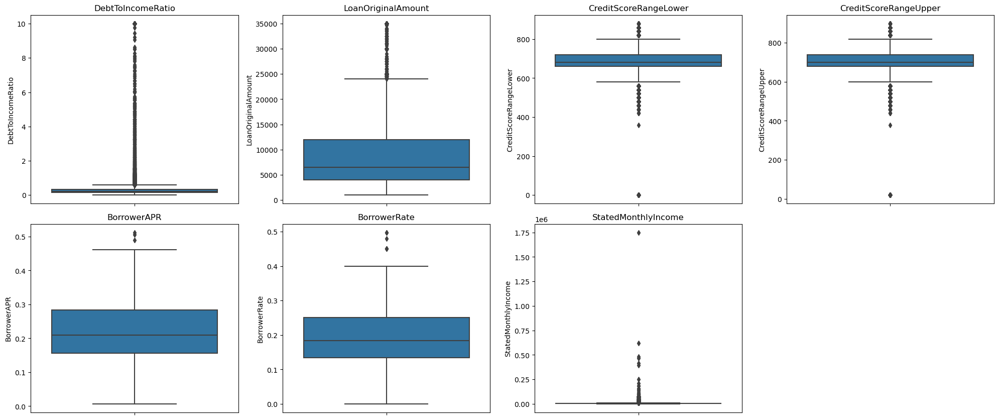

In [16]:
#checking outliers

num_columns=['DebtToIncomeRatio',
'LoanOriginalAmount',
'CreditScoreRangeLower',
'CreditScoreRangeUpper',
'BorrowerAPR',
'BorrowerRate',
'StatedMonthlyIncome']


# Create a figure and a set of subplots
fig, axes = plt.subplots(nrows=12, ncols=4, figsize=(20, 50))

axes = axes.flatten()

# Plot each continuous variable
for i, col in enumerate(num_columns):
    sns.boxplot(y=df[col], ax=axes[i])
    axes[i].set_title(col)

# Hide any remaining empty subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

# **Winsorized Data to Reduce the Influence of Outliers**

In [17]:
def winsorize_series(series, limits=[0.01, 0.99]):
    lower_limit = series.quantile(limits[0])
    upper_limit = series.quantile(limits[1])
    return np.clip(series, lower_limit, upper_limit)

def apply_winsorization(df, columns, limits=[0.01, 0.99]):
    for col in columns:
        df[col] = winsorize_series(df[col], limits)
    return df



df = apply_winsorization(df_loan, num_columns, limits=[0.01, 0.99])

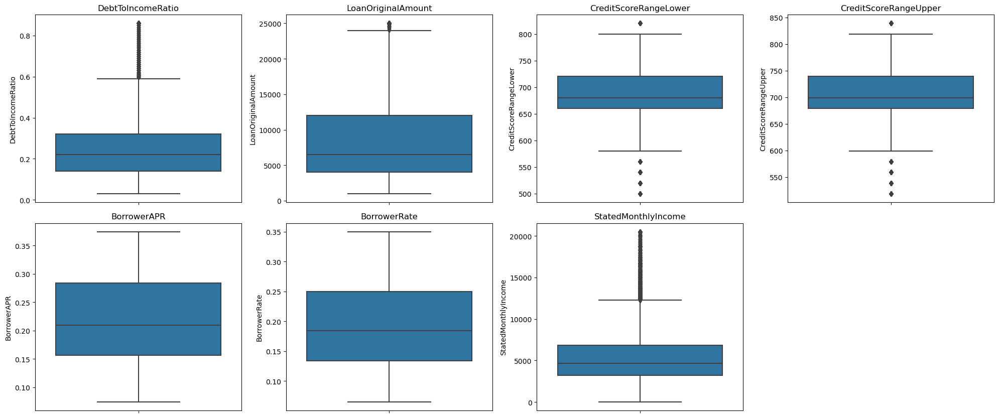

In [18]:
fig, axes = plt.subplots(nrows=6, ncols=4, figsize=(20, 25))

# Flatten the axes array
axes = axes.flatten()

# Plot each continuous variable
for i, col in enumerate(num_columns):
    sns.boxplot(y=df[col], ax=axes[i])
    axes[i].set_title(col)

# Hide any remaining empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

# **Handling Null Values**

In [19]:
df_loan.isna().sum()

ListingNumber                    0
ProsperRating (Alpha)        29084
ProsperScore                 29084
ListingCategory (numeric)        0
Occupation                    3588
EmploymentStatus              2255
CurrentCreditLines            7604
OpenRevolvingAccounts            0
DebtToIncomeRatio             8554
IncomeVerifiable                 0
LoanOriginalAmount               0
LoanStatus                       0
TotalInquiries                1159
TotalTrades                   7544
CreditScoreRangeLower          591
CreditScoreRangeUpper          591
BorrowerState                 5515
LoanOriginationDate              0
LoanCurrentDaysDelinquent        0
IncomeRange                      0
MonthlyLoanPayment               0
BorrowerAPR                     25
BorrowerRate                     0
StatedMonthlyIncome              0
Term                             0
ClosedDate                   58848
dtype: int64

In [20]:
df_loan.shape

(113937, 26)

In [21]:
df_loan=df_loan.dropna(subset=['ProsperRating (Alpha)','DebtToIncomeRatio'])

In [22]:
df_loan.isna().sum()

ListingNumber                    0
ProsperRating (Alpha)            0
ProsperScore                     0
ListingCategory (numeric)        0
Occupation                    1333
EmploymentStatus                 0
CurrentCreditLines               0
OpenRevolvingAccounts            0
DebtToIncomeRatio                0
IncomeVerifiable                 0
LoanOriginalAmount               0
LoanStatus                       0
TotalInquiries                   0
TotalTrades                      0
CreditScoreRangeLower            0
CreditScoreRangeUpper            0
BorrowerState                    0
LoanOriginationDate              0
LoanCurrentDaysDelinquent        0
IncomeRange                      0
MonthlyLoanPayment               0
BorrowerAPR                      0
BorrowerRate                     0
StatedMonthlyIncome              0
Term                             0
ClosedDate                   54524
dtype: int64

In [23]:
df_loan['DebtToIncomeRatio'].unique()

array([0.18, 0.15, 0.26, 0.36, 0.27, 0.24, 0.25, 0.12, 0.09, 0.2 , 0.49,
       0.41, 0.86, 0.39, 0.16, 0.11, 0.32, 0.04, 0.22, 0.05, 0.17, 0.14,
       0.31, 0.08, 0.1 , 0.19, 0.13, 0.35, 0.21, 0.28, 0.37, 0.29, 0.03,
       0.42, 0.53, 0.23, 0.4 , 0.3 , 0.43, 0.56, 0.54, 0.45, 0.33, 0.48,
       0.44, 0.07, 0.06, 0.34, 0.51, 0.52, 0.57, 0.38, 0.55, 0.47, 0.59,
       0.7 , 0.75, 0.58, 0.5 , 0.63, 0.62, 0.65, 0.46, 0.6 , 0.69, 0.71,
       0.64, 0.66, 0.61, 0.79, 0.83, 0.78, 0.8 , 0.84, 0.68, 0.76, 0.77,
       0.82, 0.67, 0.72, 0.73, 0.74, 0.85, 0.81])

In [24]:
df['Occupation'].unique()

array(['Other', 'Professional', 'Skilled Labor', 'Executive',
       'Sales - Retail', 'Laborer', 'Food Service', 'Fireman',
       'Waiter/Waitress', 'Construction', 'Computer Programmer',
       'Sales - Commission', 'Retail Management', 'Engineer - Mechanical',
       'Military Enlisted', 'Clerical', nan, 'Teacher', 'Clergy',
       'Accountant/CPA', 'Attorney', 'Nurse (RN)', 'Analyst',
       "Nurse's Aide", 'Investor', 'Realtor', 'Flight Attendant',
       'Nurse (LPN)', 'Military Officer', 'Food Service Management',
       'Truck Driver', 'Administrative Assistant',
       'Police Officer/Correction Officer', 'Social Worker',
       'Tradesman - Mechanic', 'Medical Technician', 'Professor',
       'Postal Service', 'Civil Service', 'Pharmacist',
       'Tradesman - Electrician', 'Scientist', 'Dentist',
       'Engineer - Electrical', 'Architect', 'Landscaping',
       'Tradesman - Carpenter', 'Bus Driver', 'Tradesman - Plumber',
       'Engineer - Chemical', 'Doctor', 'Chemist',


In [25]:
df_loan['Occupation'].isna().sum()

1333

In [26]:
df_loan.isna().sum()

ListingNumber                    0
ProsperRating (Alpha)            0
ProsperScore                     0
ListingCategory (numeric)        0
Occupation                    1333
EmploymentStatus                 0
CurrentCreditLines               0
OpenRevolvingAccounts            0
DebtToIncomeRatio                0
IncomeVerifiable                 0
LoanOriginalAmount               0
LoanStatus                       0
TotalInquiries                   0
TotalTrades                      0
CreditScoreRangeLower            0
CreditScoreRangeUpper            0
BorrowerState                    0
LoanOriginationDate              0
LoanCurrentDaysDelinquent        0
IncomeRange                      0
MonthlyLoanPayment               0
BorrowerAPR                      0
BorrowerRate                     0
StatedMonthlyIncome              0
Term                             0
ClosedDate                   54524
dtype: int64

In [27]:
df_loan['Occupation'].fillna('Unknown', inplace=True)

In [28]:
df_loan['Occupation'].isna().sum()

0

In [29]:
df_loan['BorrowerState'].value_counts()

BorrowerState
CA    9746
NY    5285
TX    5168
FL    4830
IL    3929
OH    3118
GA    3057
VA    2569
NJ    2506
PA    2459
MI    2415
NC    2233
MD    2089
WA    1953
MA    1709
MO    1625
MN    1567
CO    1558
IN    1536
TN    1417
WI    1386
CT    1383
AZ    1267
AL    1109
OR    1072
NV     946
SC     890
KY     819
KS     790
LA     780
AR     704
OK     677
MS     618
NE     506
UT     454
NH     415
RI     382
ID     358
DC     313
HI     309
NM     296
WV     283
DE     255
MT     194
SD     166
VT     157
AK     150
WY     109
Name: count, dtype: int64

In [30]:
df_loan['BorrowerState'].isna().sum()

0

In [31]:
df_loan['EmploymentStatus'].unique()

array(['Employed', 'Other', 'Full-time', 'Part-time', 'Retired',
       'Self-employed', 'Not employed'], dtype=object)

In [32]:
df_loan['EmploymentStatus'].value_counts()

EmploymentStatus
Employed         65884
Full-time         7585
Other             3526
Retired            320
Part-time          199
Self-employed       42
Not employed         1
Name: count, dtype: int64

In [33]:
df_loan['EmploymentStatus'].isna().sum()

0

In [34]:
category_mapping = {
    0: 'Not Available', 1: 'Debt Consolidation', 2: 'Home Improvement', 3: 'Business', 
    4: 'Personal Loan', 5: 'Student Use', 6: 'Auto', 7: 'Other', 8: 'Baby&Adoption', 
    9: 'Boat', 10: 'Cosmetic Procedure', 11: 'Engagement Ring', 12: 'Green Loans', 
    13: 'Household Expenses', 14: 'Large Purchases', 15: 'Medical/Dental', 
    16: 'Motorcycle', 17: 'RV', 18: 'Taxes', 19: 'Vacation', 20: 'Wedding Loans'
}

In [35]:
df_loan['ListingCategory (label)'] = df_loan['ListingCategory (numeric)'].map(category_mapping)

In [36]:
df_loan['ListingCategory (label)'].unique()

array(['Home Improvement', 'Motorcycle', 'Debt Consolidation', 'Other',
       'Household Expenses', 'Auto', 'Medical/Dental', 'Wedding Loans',
       'Vacation', 'Taxes', 'Baby&Adoption', 'Engagement Ring',
       'Business', 'Large Purchases', 'Boat', 'RV', 'Not Available',
       'Cosmetic Procedure', 'Student Use', 'Green Loans'], dtype=object)

In [37]:
def determine_loan_status(row):
    closed_date_missing = pd.isnull(row['ClosedDate'])
    loan_delinquent = row['LoanCurrentDaysDelinquent'] > 180
    return 'Active' if closed_date_missing or loan_delinquent else 'Closed'

df_loan['Status'] = df_loan.apply(determine_loan_status, axis=1)

In [38]:
df_loan.head()

,ListingNumber,ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),Occupation,EmploymentStatus,CurrentCreditLines,OpenRevolvingAccounts,DebtToIncomeRatio,IncomeVerifiable,...,LoanCurrentDaysDelinquent,IncomeRange,MonthlyLoanPayment,BorrowerAPR,BorrowerRate,StatedMonthlyIncome,Term,ClosedDate,ListingCategory (label),Status
1,1209647,A,7.0,2,Professional,Employed,14.0,13,0.18,True,...,0,"$50,000-74,999",318.93,0.12016,0.0920,6125.000000,36,NaN,Home Improvement,Active
3,658116,A,9.0,16,Skilled Labor,Employed,5.0,7,0.15,True,...,0,"$25,000-49,999",321.45,0.12528,0.0974,2875.000000,36,NaN,Motorcycle,Active
4,909464,D,4.0,2,Executive,Employed,19.0,6,0.26,True,...,0,"$100,000+",563.97,0.24614,0.2085,9583.333333,36,NaN,Home Improvement,Active
5,1074836,B,10.0,1,Professional,Employed,21.0,13,0.36,True,...,0,"$100,000+",342.37,0.15425,0.1314,8333.333333,60,NaN,Debt Consolidation,Active
6,750899,E,2.0,1,Sales - Retail,Employed,10.0,6,0.27,True,...,0,"$25,000-49,999",122.67,0.31032,0.2712,2083.333333,36,NaN,Debt Consolidation,Active


In [39]:
df_loan.info()

<class 'pandas.core.frame.DataFrame'>
Index: 77557 entries, 1 to 113936
Data columns (total 28 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   ListingNumber              77557 non-null  int64  
 1   ProsperRating (Alpha)      77557 non-null  object 
 2   ProsperScore               77557 non-null  float64
 3   ListingCategory (numeric)  77557 non-null  int64  
 4   Occupation                 77557 non-null  object 
 5   EmploymentStatus           77557 non-null  object 
 6   CurrentCreditLines         77557 non-null  float64
 7   OpenRevolvingAccounts      77557 non-null  int64  
 8   DebtToIncomeRatio          77557 non-null  float64
 9   IncomeVerifiable           77557 non-null  bool   
 10  LoanOriginalAmount         77557 non-null  int64  
 11  LoanStatus                 77557 non-null  object 
 12  TotalInquiries             77557 non-null  float64
 13  TotalTrades                77557 non-null  float64

In [40]:
df_loan.columns

Index(['ListingNumber', 'ProsperRating (Alpha)', 'ProsperScore',
       'ListingCategory (numeric)', 'Occupation', 'EmploymentStatus',
       'CurrentCreditLines', 'OpenRevolvingAccounts', 'DebtToIncomeRatio',
       'IncomeVerifiable', 'LoanOriginalAmount', 'LoanStatus',
       'TotalInquiries', 'TotalTrades', 'CreditScoreRangeLower',
       'CreditScoreRangeUpper', 'BorrowerState', 'LoanOriginationDate',
       'LoanCurrentDaysDelinquent', 'IncomeRange', 'MonthlyLoanPayment',
       'BorrowerAPR', 'BorrowerRate', 'StatedMonthlyIncome', 'Term',
       'ClosedDate', 'ListingCategory (label)', 'Status'],
      dtype='object')

In [41]:
df_loan['ProsperScore'].unique()

array([ 7.,  9.,  4., 10.,  2., 11.,  8.,  5.,  3.,  6.,  1.])

# **Univarient Analysis**

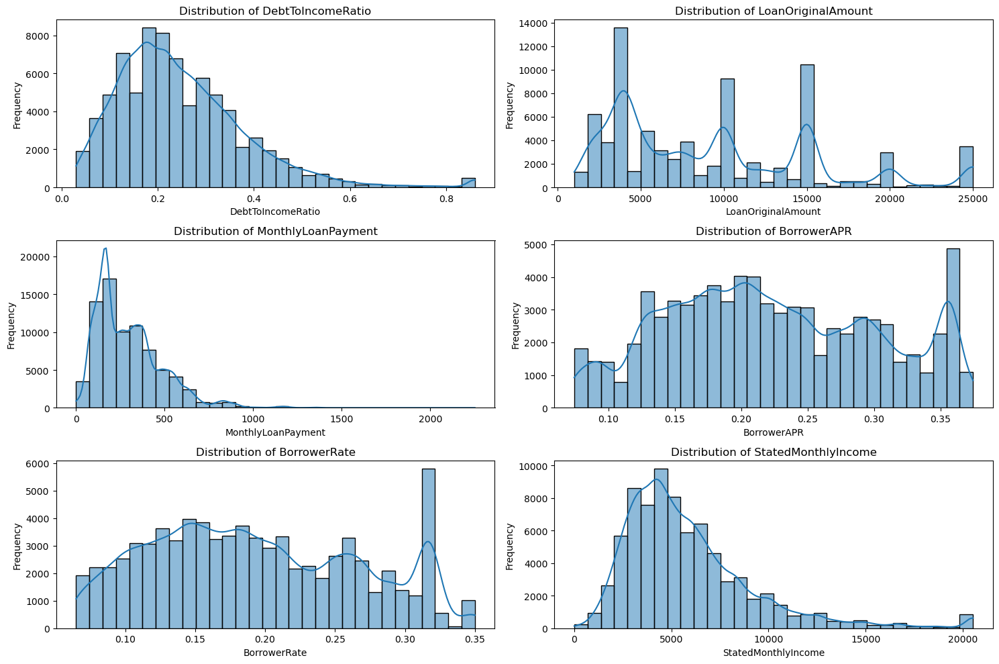

In [42]:
columns_to_plot = [
    'DebtToIncomeRatio', 
    'LoanOriginalAmount', 
    'MonthlyLoanPayment', 
    'BorrowerAPR', 
    'BorrowerRate', 
    'StatedMonthlyIncome'
]

# Set up the matplotlib figure
plt.figure(figsize=(15, 10))

# Plot each column
for i, column in enumerate(columns_to_plot, 1):
    plt.subplot(3, 2, i)  # Adjust the grid to fit all plots
    sns.histplot(df_loan[column], kde=True, bins=30)  # Using histplot instead of distplot as distplot is deprecated
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()

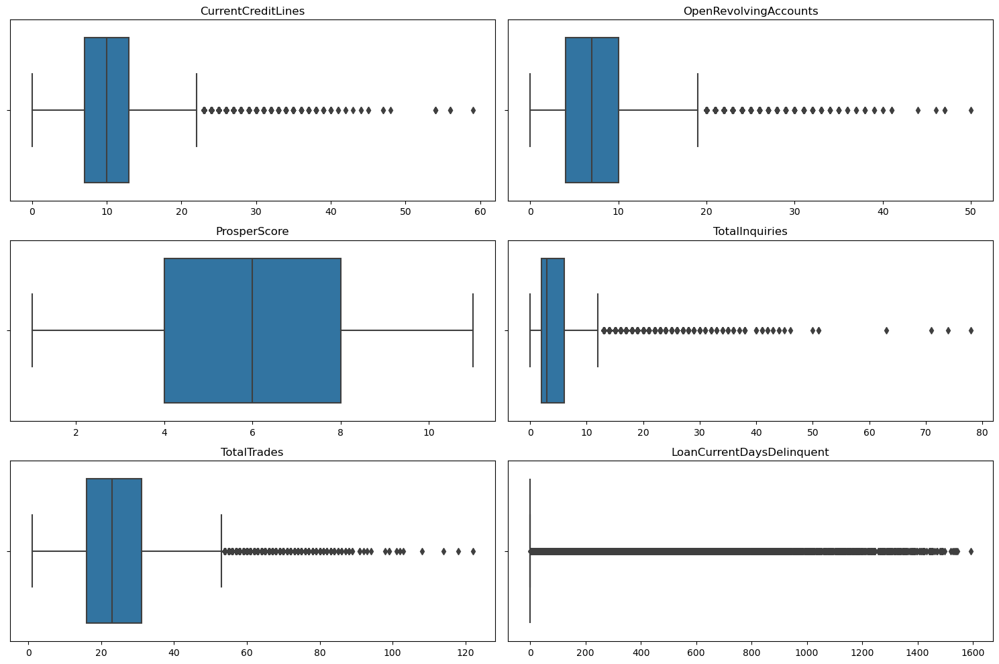

In [43]:
discrete_features = ['CurrentCreditLines', 'OpenRevolvingAccounts','ProsperScore', 'TotalInquiries', 'TotalTrades','LoanCurrentDaysDelinquent']

# Create subplots for boxplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 10))
axes = axes.flatten()

# Plot violin plots for each discrete feature
for ax, feature in zip(axes, discrete_features):
    sns.boxplot(x=feature, data=df_loan, ax=ax)
    ax.set_title(feature)
    ax.set_xlabel('')
    ax.set_ylabel('')

# Adjust layout
plt.tight_layout()
plt.show()


# Insights

1.Current credit lines suggests that a significant number of borrowers have a relatively low number of current credit lines.

2.Borrowers with ProsperScores between 4 to 8 exhibit higher levels of creditworthiness or risk assessment by Prosper.
    
3.The concentration of open revolving accounts between 0 to 20 indicates that many borrowers have a moderate number of open lines of 
credit, such as credit cards or lines of credit. 

4.Most borrowers have relatively few recent credit inquiries

5.Most borrowers exhibit a moderate level of credit engagement and diversity, influencing lenders' risk evaluations in loan applications.

In [44]:
df_loan.columns

Index(['ListingNumber', 'ProsperRating (Alpha)', 'ProsperScore',
       'ListingCategory (numeric)', 'Occupation', 'EmploymentStatus',
       'CurrentCreditLines', 'OpenRevolvingAccounts', 'DebtToIncomeRatio',
       'IncomeVerifiable', 'LoanOriginalAmount', 'LoanStatus',
       'TotalInquiries', 'TotalTrades', 'CreditScoreRangeLower',
       'CreditScoreRangeUpper', 'BorrowerState', 'LoanOriginationDate',
       'LoanCurrentDaysDelinquent', 'IncomeRange', 'MonthlyLoanPayment',
       'BorrowerAPR', 'BorrowerRate', 'StatedMonthlyIncome', 'Term',
       'ClosedDate', 'ListingCategory (label)', 'Status'],
      dtype='object')

Text(0.5, 0, '')

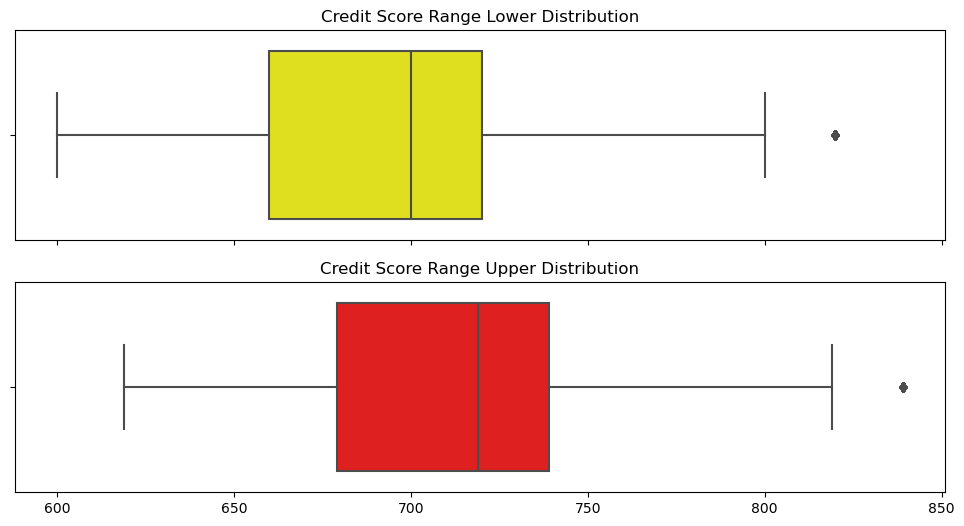

In [45]:
f, (ax1, ax2) = plt.subplots(nrows=2, sharey=False, sharex=True, figsize=(12, 6))

# First boxplot
sns.boxplot(x='CreditScoreRangeLower', data=df_loan, color='yellow', ax=ax1)
ax1.set_title('Credit Score Range Lower Distribution')
ax1.set_xlabel('')  # Remove x-axis label

# Second boxplot
sns.boxplot(x='CreditScoreRangeUpper', data=df_loan, color='red', ax=ax2)
ax2.set_title('Credit Score Range Upper Distribution')
ax2.set_xlabel('')  # Remove x-axis label

From the Box Plot, it can be seen that most of the borrowers have a Credit Score in the range of 650 - 750.

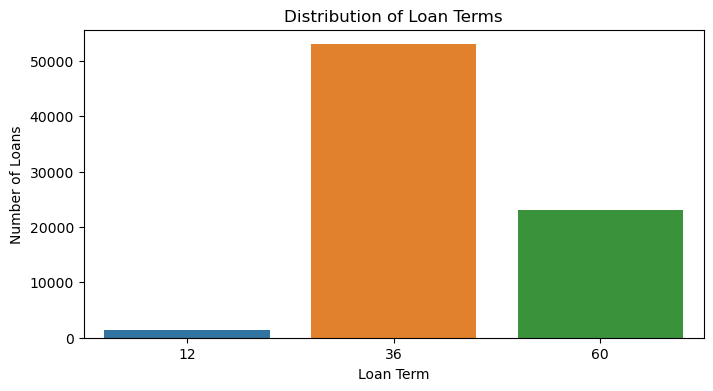

In [46]:
fig = plt.figure(figsize=(8,4))
sns.countplot(x='Term', data=df_loan)
plt.title('Distribution of Loan Terms')
plt.xlabel('Loan Term')
plt.ylabel('Number of Loans')
plt.show()

Majority of the loans in the dataset are taken for a period of 36 Months/3 Years, with the loans for the duration of 12 Months being very rare. Also, a smaller portion of the loans are also given for a duration of 60 Months/5 Years.

<Axes: xlabel='count', ylabel='ListingCategory (label)'>

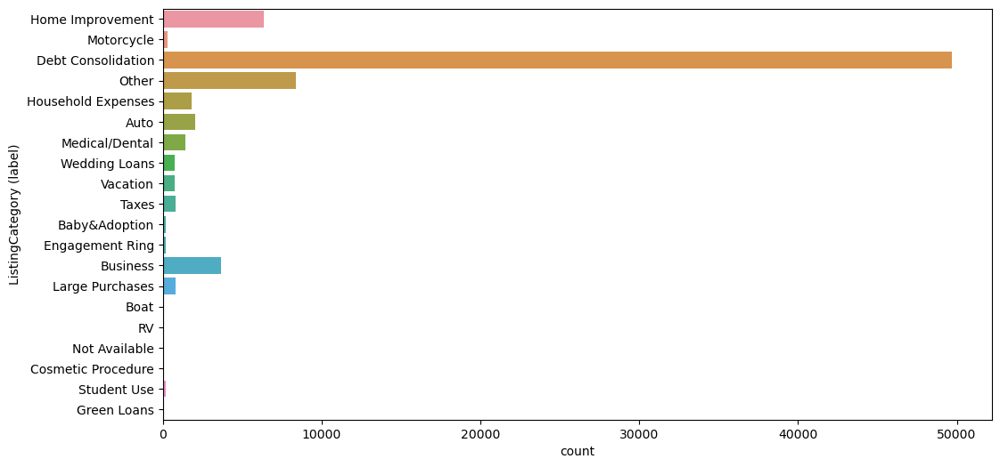

In [47]:
fig = plt.figure(figsize=(12,6))
sns.countplot(y='ListingCategory (label)', data=df_loan)

# Insights

A high number of listings for debt consolidation indicates that many borrowers are seeking to consolidate their existing debts, which
could reflect widespread consumer debt issues and the need for manageable repayment plans.
there is moderate interest in borrowing for home improvements and business investments. This trend can guide lenders to prioritize debt
consolidation products and maintain a balanced offering for home and business loan segments.

In [48]:
df_loan.head()

,ListingNumber,ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),Occupation,EmploymentStatus,CurrentCreditLines,OpenRevolvingAccounts,DebtToIncomeRatio,IncomeVerifiable,...,LoanCurrentDaysDelinquent,IncomeRange,MonthlyLoanPayment,BorrowerAPR,BorrowerRate,StatedMonthlyIncome,Term,ClosedDate,ListingCategory (label),Status
1,1209647,A,7.0,2,Professional,Employed,14.0,13,0.18,True,...,0,"$50,000-74,999",318.93,0.12016,0.0920,6125.000000,36,NaN,Home Improvement,Active
3,658116,A,9.0,16,Skilled Labor,Employed,5.0,7,0.15,True,...,0,"$25,000-49,999",321.45,0.12528,0.0974,2875.000000,36,NaN,Motorcycle,Active
4,909464,D,4.0,2,Executive,Employed,19.0,6,0.26,True,...,0,"$100,000+",563.97,0.24614,0.2085,9583.333333,36,NaN,Home Improvement,Active
5,1074836,B,10.0,1,Professional,Employed,21.0,13,0.36,True,...,0,"$100,000+",342.37,0.15425,0.1314,8333.333333,60,NaN,Debt Consolidation,Active
6,750899,E,2.0,1,Sales - Retail,Employed,10.0,6,0.27,True,...,0,"$25,000-49,999",122.67,0.31032,0.2712,2083.333333,36,NaN,Debt Consolidation,Active


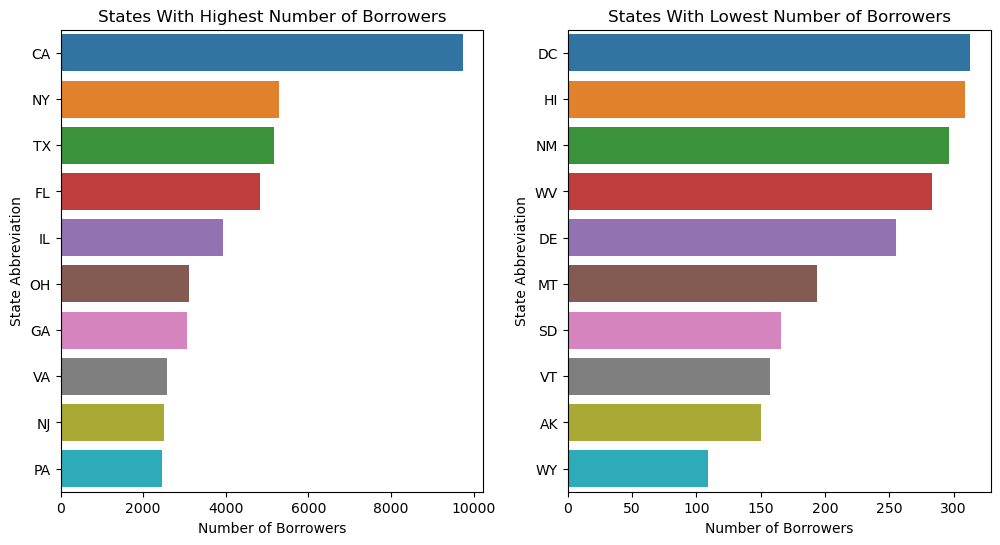

In [49]:
most_state_list = df_loan['BorrowerState'].value_counts()[:10].index.tolist()
most_state_count = df_loan['BorrowerState'].value_counts()[:10].values.tolist()

least_state_list = df_loan['BorrowerState'].value_counts()[-10:].index.tolist()
least_state_count = df_loan['BorrowerState'].value_counts()[-10:].values.tolist()

f,(ax1,ax2) = plt.subplots(ncols=2, sharey=False, sharex=False,
                          figsize=(12,6))

sns.barplot(x=most_state_count, y=most_state_list, ax=ax1)
ax1.set_title('States With Highest Number of Borrowers')
ax1.set_xlabel('Number of Borrowers')
ax1.set_ylabel('State Abbreviation')

sns.barplot(x=least_state_count, y=least_state_list, ax=ax2)
ax2.set_title('States With Lowest Number of Borrowers')
ax2.set_xlabel('Number of Borrowers')
ax2.set_ylabel('State Abbreviation')
plt.show()

The state of California, is the state with the most number of borrowers, and California, Texas and New York are the top 3 states with the most number of borrowers.
The state of North Dakota is the state with the least number of borrowers, and Wyoming, Maine and North Dakota are the 3 states with the least number of borrowers.

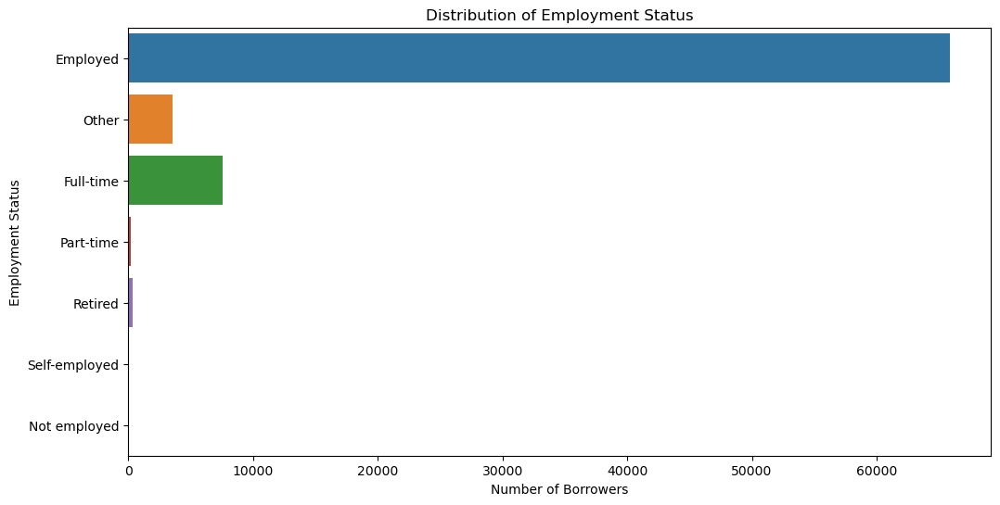

In [50]:
fig = plt.figure(figsize=(12,6))
sns.countplot(y='EmploymentStatus', data=df_loan)
plt.title('Distribution of Employment Status')
plt.ylabel('Employment Status')
plt.xlabel('Number of Borrowers')
plt.show()

# Insights

Loans are predominantly accessed by full-time employed individuals, reflecting their stable income.

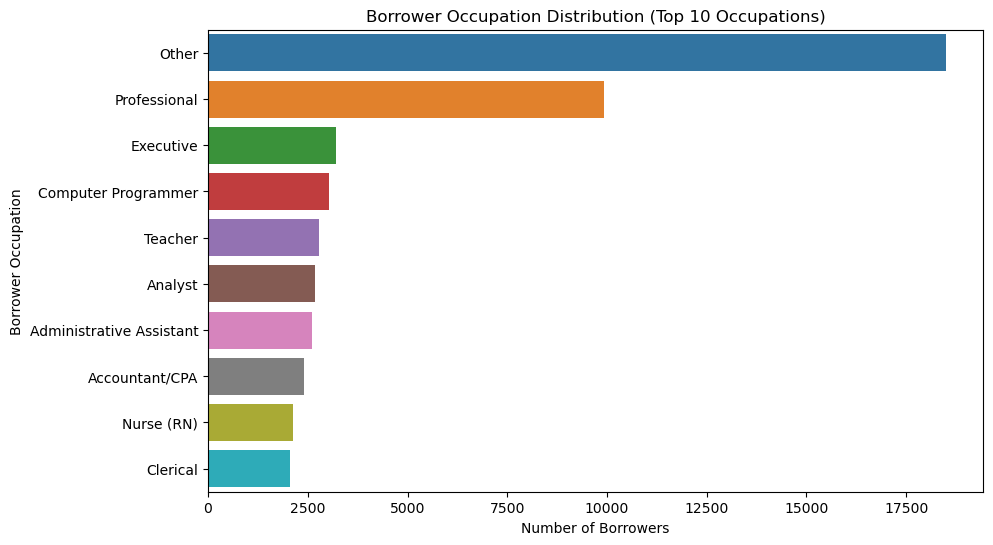

In [51]:
occp_list = df_loan['Occupation'].value_counts()[:10].index.tolist()
occp_count = df_loan['Occupation'].value_counts()[:10].values.tolist()

fig = plt.figure(figsize=(10,6))
sns.barplot(y=occp_list, x=occp_count)
plt.title('Borrower Occupation Distribution (Top 10 Occupations)')
plt.xlabel('Number of Borrowers')
plt.ylabel('Borrower Occupation')
plt.show()

# Insights

Many borrowers come from management, administration, and professional services, likely reflecting stable and higher income levels that 
qualify them for loans.
The "other" category's highest distribution suggests a wide variety of occupations outside traditional professional roles

---------------------------------------------------------------------------------------------------------------

# **Bivarient Analysis**

In [52]:
df_loan.columns

Index(['ListingNumber', 'ProsperRating (Alpha)', 'ProsperScore',
       'ListingCategory (numeric)', 'Occupation', 'EmploymentStatus',
       'CurrentCreditLines', 'OpenRevolvingAccounts', 'DebtToIncomeRatio',
       'IncomeVerifiable', 'LoanOriginalAmount', 'LoanStatus',
       'TotalInquiries', 'TotalTrades', 'CreditScoreRangeLower',
       'CreditScoreRangeUpper', 'BorrowerState', 'LoanOriginationDate',
       'LoanCurrentDaysDelinquent', 'IncomeRange', 'MonthlyLoanPayment',
       'BorrowerAPR', 'BorrowerRate', 'StatedMonthlyIncome', 'Term',
       'ClosedDate', 'ListingCategory (label)', 'Status'],
      dtype='object')

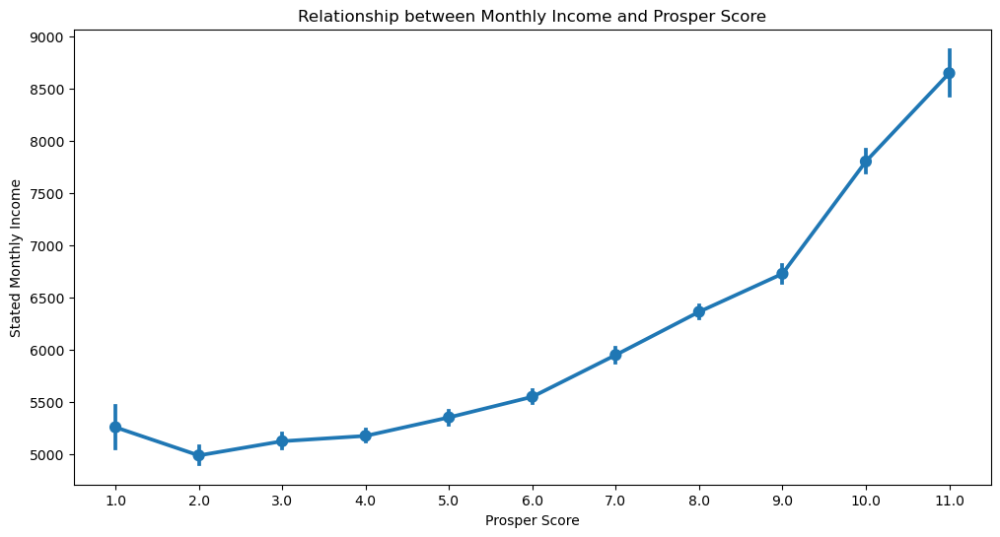

In [53]:
fig = plt.figure(figsize=(12,6))
sns.pointplot(y='StatedMonthlyIncome', x='ProsperScore', data=df_loan)
plt.title('Relationship between Monthly Income and Prosper Score')
plt.xlabel('Prosper Score')
plt.ylabel('Stated Monthly Income')
plt.show()

It can be observed that there is Strong Positive Correlation between Monthly Income and Prosper Score. Higher the Monthly Income, Higher the Prosper Score.

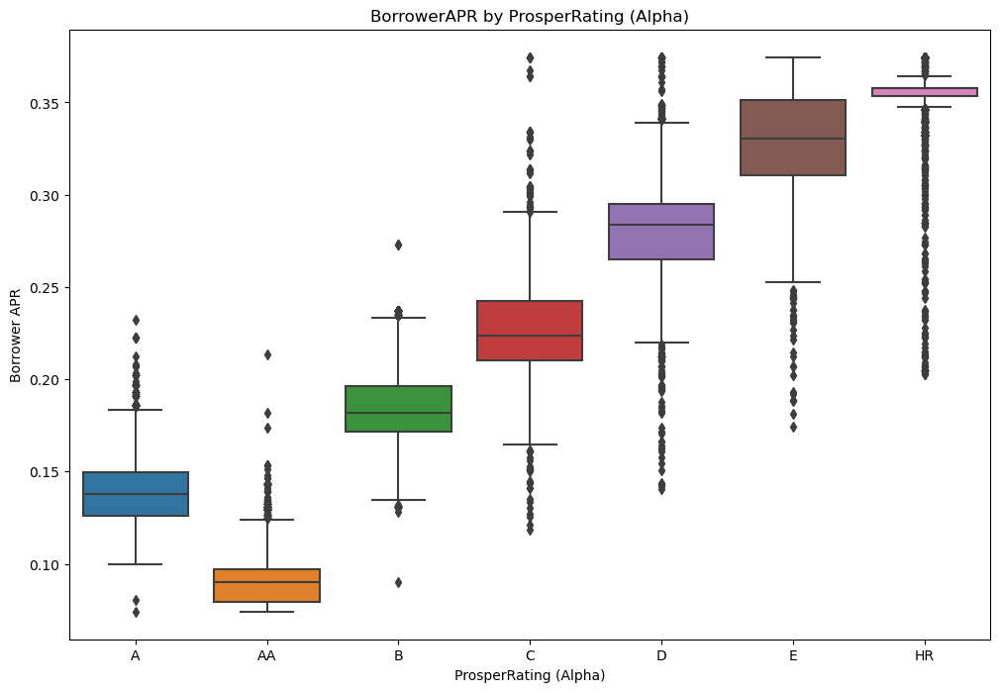

In [54]:
plt.figure(figsize=(12, 8))
sns.boxplot(x='ProsperRating (Alpha)', y='BorrowerAPR', data=df_loan, order=sorted(df_loan['ProsperRating (Alpha)'].unique()))
plt.title('BorrowerAPR by ProsperRating (Alpha)')
plt.xlabel('ProsperRating (Alpha)')
plt.ylabel('Borrower APR')
plt.show()

# Insights

The analysis confirms that as borrower risk increases, indicated by Prosper ratings, the corresponding APR also rises, reflecting the 
higher interest rates charged to compensate for increased risk.

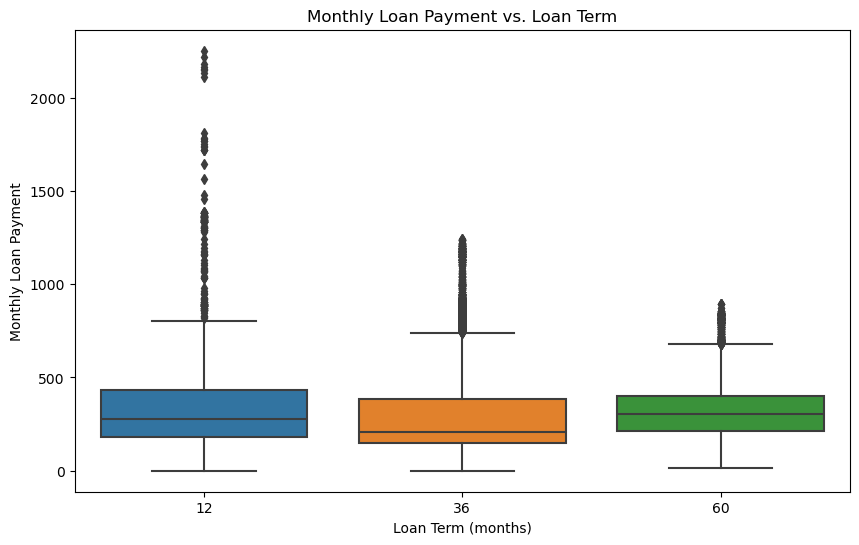

In [55]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Term', y='MonthlyLoanPayment', data=df_loan)
plt.title('Monthly Loan Payment vs. Loan Term')
plt.xlabel('Loan Term (months)')
plt.ylabel('Monthly Loan Payment')
plt.show()

# Insights

Borrowers can choose different loan terms with relatively similar monthly payments, providing flexibility based on their financial 
situation and preferences.

In [56]:
df_loan.columns

Index(['ListingNumber', 'ProsperRating (Alpha)', 'ProsperScore',
       'ListingCategory (numeric)', 'Occupation', 'EmploymentStatus',
       'CurrentCreditLines', 'OpenRevolvingAccounts', 'DebtToIncomeRatio',
       'IncomeVerifiable', 'LoanOriginalAmount', 'LoanStatus',
       'TotalInquiries', 'TotalTrades', 'CreditScoreRangeLower',
       'CreditScoreRangeUpper', 'BorrowerState', 'LoanOriginationDate',
       'LoanCurrentDaysDelinquent', 'IncomeRange', 'MonthlyLoanPayment',
       'BorrowerAPR', 'BorrowerRate', 'StatedMonthlyIncome', 'Term',
       'ClosedDate', 'ListingCategory (label)', 'Status'],
      dtype='object')

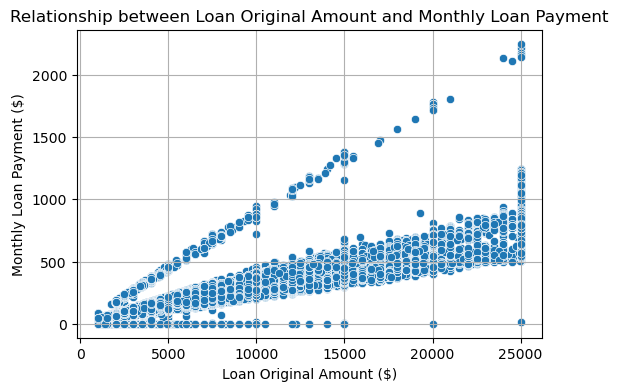

In [57]:
plt.figure(figsize=(6,4))
sns.scatterplot(x='LoanOriginalAmount', y='MonthlyLoanPayment', data=df_loan)
plt.title('Relationship between Loan Original Amount and Monthly Loan Payment')
plt.xlabel('Loan Original Amount ($)')
plt.ylabel('Monthly Loan Payment ($)')
plt.grid(True)
plt.show()

# Insights

The upward trend in the scatter plot confirms that higher loan amounts are associated with higher monthly payments. This relationship 
is intuitive as borrowers typically need to repay larger loan amounts over time, resulting in larger monthly payments.

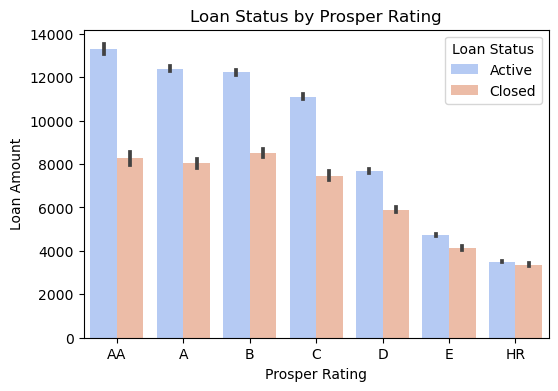

In [58]:
plt.figure(figsize=(6,4))
sns.barplot(x='ProsperRating (Alpha)', y='LoanOriginalAmount', hue='Status', 
            data=df_loan, palette='coolwarm', 
            order=['AA', 'A', 'B', 'C', 'D', 'E', 'HR'])
plt.title('Loan Status by Prosper Rating')
plt.xlabel('Prosper Rating')
plt.ylabel('Loan Amount')
plt.legend(title='Loan Status')
plt.show()

# Insights

These findings show that when borrowers have higher creditworthiness ratings (ProsperRating), they tend to receive smaller loan amounts 
and are more likely to successfully close their loans. This suggests that lenders prefer to offer smaller loans to more creditworthy 
borrowers, who are also more likely to repay their loans on time. It reflects a balanced approach by lenders to manage risk effectively 
while ensuring borrowers' ability to repay their debts.

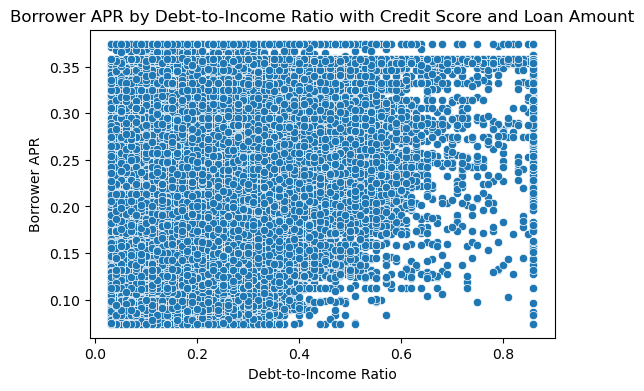

In [59]:
plt.figure(figsize=(6,4))
sns.scatterplot(x='DebtToIncomeRatio', y='BorrowerAPR',data=df_loan, palette='coolwarm')
plt.title('Borrower APR by Debt-to-Income Ratio with Credit Score and Loan Amount')
plt.xlabel('Debt-to-Income Ratio')
plt.ylabel('Borrower APR')
plt.show()

# Insights

The spread of data points in Borrower APR within this range suggests that despite having similar DTI ratios, borrowers have been 
assigned a wide range of APRs. This variability could be due to other factors influencing the APR calculation, such as credit score, 
loan purpose, employment status, or loan amount.

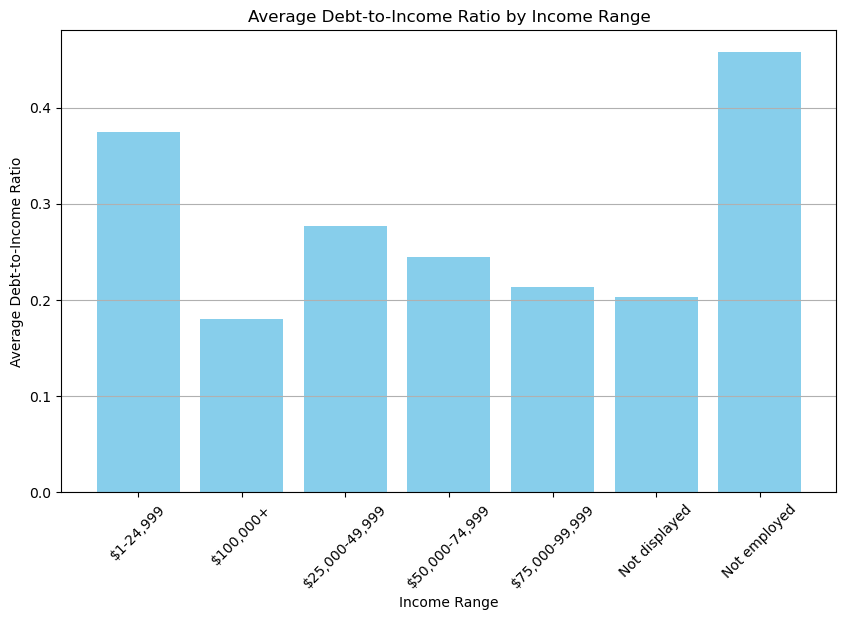

In [60]:
# Grouping data by IncomeRange and calculating average DebtToIncomeRatio for each group
income_debt_ratio = df.groupby('IncomeRange')['DebtToIncomeRatio'].mean().reset_index()

# Sorting by IncomeRange for better visualization
income_debt_ratio = income_debt_ratio.sort_values(by='IncomeRange')

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(income_debt_ratio['IncomeRange'], income_debt_ratio['DebtToIncomeRatio'], color='skyblue')
plt.xlabel('Income Range')
plt.ylabel('Average Debt-to-Income Ratio')
plt.title('Average Debt-to-Income Ratio by Income Range')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

In [61]:
# Extract month and year from LoanOriginationDate
df_loan['LoanOriginationDate'] = pd.to_datetime(df_loan['LoanOriginationDate'], format="%d-%m-%Y %H:%M")
df_loan['OriginationYear'] = df_loan['LoanOriginationDate'].dt.year
df_loan['OriginationMonth'] = df_loan['LoanOriginationDate'].dt.month

df_loan.head()

,ListingNumber,ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),Occupation,EmploymentStatus,CurrentCreditLines,OpenRevolvingAccounts,DebtToIncomeRatio,IncomeVerifiable,...,MonthlyLoanPayment,BorrowerAPR,BorrowerRate,StatedMonthlyIncome,Term,ClosedDate,ListingCategory (label),Status,OriginationYear,OriginationMonth
1,1209647,A,7.0,2,Professional,Employed,14.0,13,0.18,True,...,318.93,0.12016,0.0920,6125.000000,36,NaN,Home Improvement,Active,2014,3
3,658116,A,9.0,16,Skilled Labor,Employed,5.0,7,0.15,True,...,321.45,0.12528,0.0974,2875.000000,36,NaN,Motorcycle,Active,2012,11
4,909464,D,4.0,2,Executive,Employed,19.0,6,0.26,True,...,563.97,0.24614,0.2085,9583.333333,36,NaN,Home Improvement,Active,2013,9
5,1074836,B,10.0,1,Professional,Employed,21.0,13,0.36,True,...,342.37,0.15425,0.1314,8333.333333,60,NaN,Debt Consolidation,Active,2013,12
6,750899,E,2.0,1,Sales - Retail,Employed,10.0,6,0.27,True,...,122.67,0.31032,0.2712,2083.333333,36,NaN,Debt Consolidation,Active,2013,4


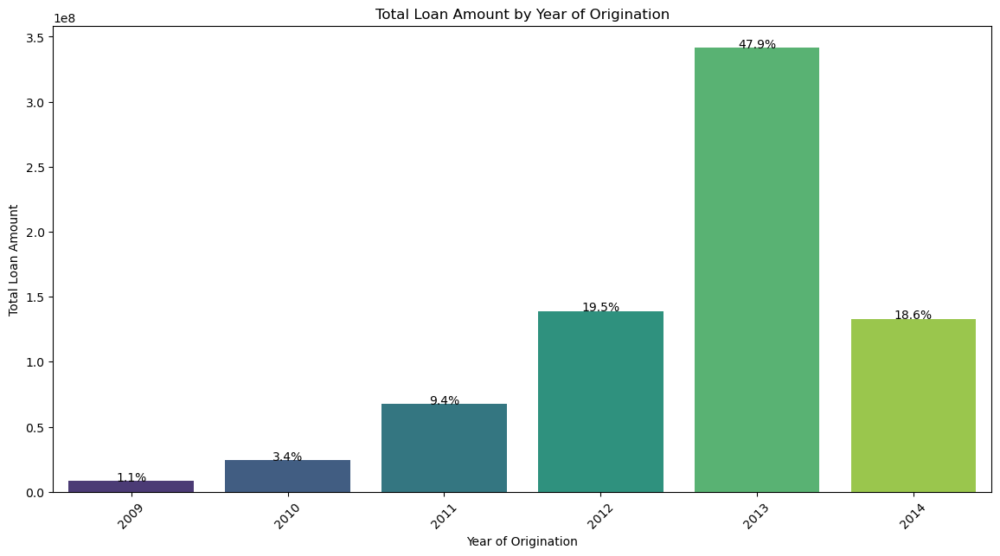

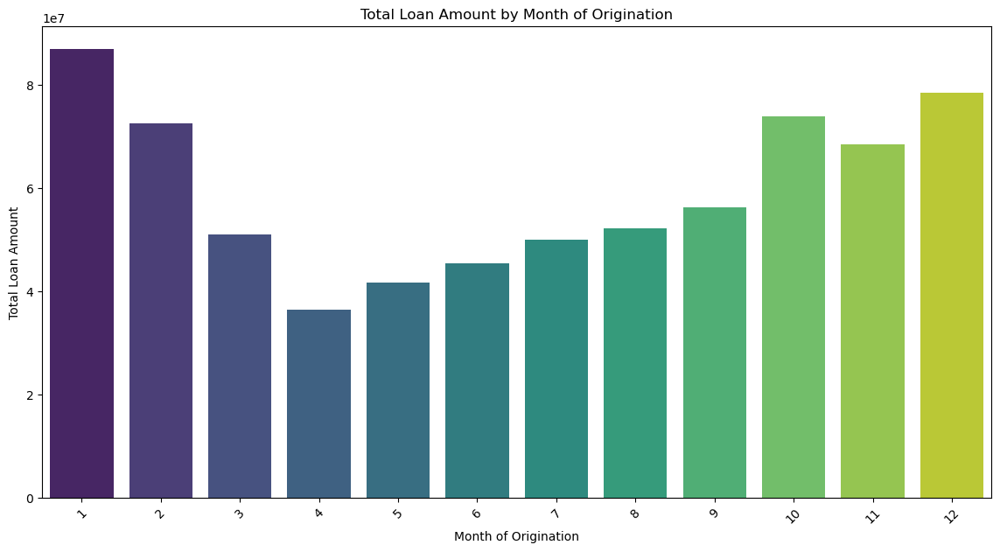

In [62]:
# Create a bar plot for the distribution of loan amounts by year with sum as estimator
plt.figure(figsize=(14, 7))
ax = sns.barplot(x='OriginationYear', y='LoanOriginalAmount', data=df_loan, estimator=sum, ci=None, palette='viridis')

# Add percentage labels
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height + 10, '{:.1f}%'.format((height / df_loan['LoanOriginalAmount'].sum()) * 100),
            ha='center')

# Set plot titles and labels
plt.title('Total Loan Amount by Year of Origination')
plt.xlabel('Year of Origination')
plt.ylabel('Total Loan Amount')
plt.xticks(rotation=45)
plt.show()

# Create a bar plot for the distribution of loan amounts by month with sum as estimator
plt.figure(figsize=(14, 7))
sns.barplot(x='OriginationMonth', y='LoanOriginalAmount', data=df_loan, estimator=sum, ci=None, palette='viridis')
plt.title('Total Loan Amount by Month of Origination')
plt.xlabel('Month of Origination')
plt.ylabel('Total Loan Amount')
plt.xticks(rotation=45)
plt.show()

# Insights

Over time, we've observed fluctuations in loan amounts, with a notable peak in 2013 accounting for 47% of total loans, followed by a 
decline to 18% in 2014. This suggests changes in economic conditions, lending practices, and risk management strategies.

The increase in loan amounts at the end or start of the year indicates seasonal borrowing patterns, likely due to holiday spending or 
new year financial goals.

In [63]:
df_loan.columns

Index(['ListingNumber', 'ProsperRating (Alpha)', 'ProsperScore',
       'ListingCategory (numeric)', 'Occupation', 'EmploymentStatus',
       'CurrentCreditLines', 'OpenRevolvingAccounts', 'DebtToIncomeRatio',
       'IncomeVerifiable', 'LoanOriginalAmount', 'LoanStatus',
       'TotalInquiries', 'TotalTrades', 'CreditScoreRangeLower',
       'CreditScoreRangeUpper', 'BorrowerState', 'LoanOriginationDate',
       'LoanCurrentDaysDelinquent', 'IncomeRange', 'MonthlyLoanPayment',
       'BorrowerAPR', 'BorrowerRate', 'StatedMonthlyIncome', 'Term',
       'ClosedDate', 'ListingCategory (label)', 'Status', 'OriginationYear',
       'OriginationMonth'],
      dtype='object')

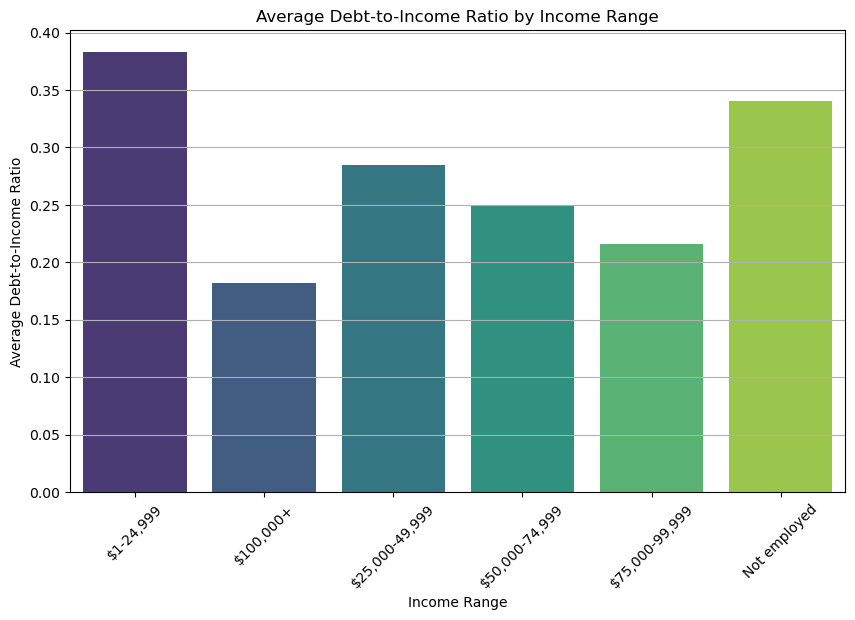

In [64]:
income_debt_ratio = df_loan.groupby('IncomeRange')['DebtToIncomeRatio'].mean().reset_index()

# Sorting the data by income range
income_debt_ratio = income_debt_ratio.sort_values(by='IncomeRange')

# Creating the bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='IncomeRange', y='DebtToIncomeRatio', data=income_debt_ratio, palette='viridis')
plt.title('Average Debt-to-Income Ratio by Income Range')
plt.xlabel('Income Range')
plt.ylabel('Average Debt-to-Income Ratio')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

# Insights

The highest debt-to-income ratio is observed among individuals earning between 1-24000 dollars and those who are not employed, highlighting potential financial strain and debt burden within these groups despite varying income levels.

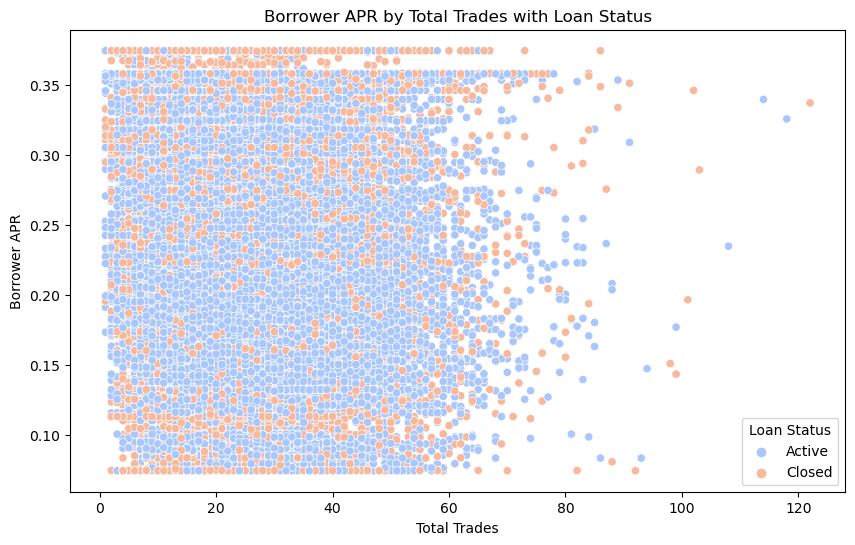

In [65]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='TotalTrades', y='BorrowerAPR', hue='Status', data=df_loan, palette='coolwarm')
plt.title('Borrower APR by Total Trades with Loan Status')
plt.xlabel('Total Trades')
plt.ylabel('Borrower APR')
plt.legend(title='Loan Status')
plt.show()

# Insights

The majority of scatter plots falling within this range belong to active loan statuses, indicating that borrowers with varying total 
trades are actively repaying their loans. This suggests that total trades may not be a significant determinant of loan default or 
repayment behavior within this range.

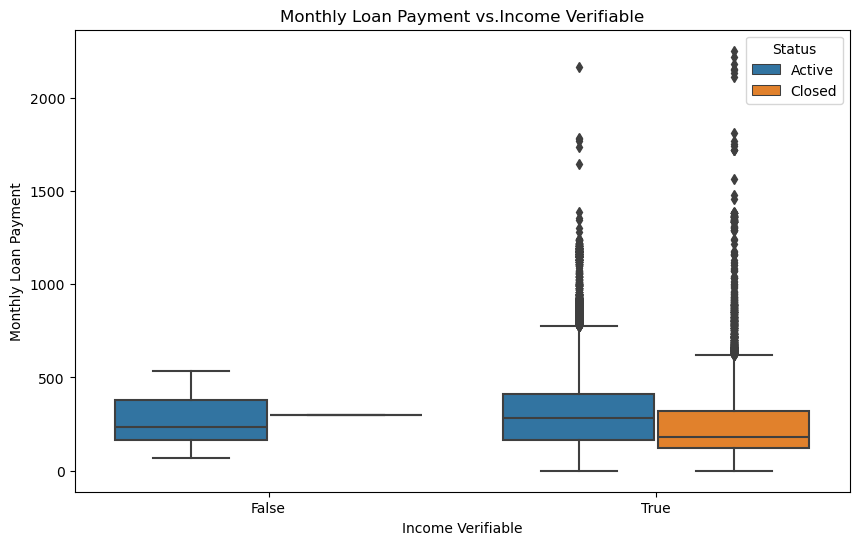

In [66]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='IncomeVerifiable', y='MonthlyLoanPayment',hue='Status', data=df_loan)
plt.title('Monthly Loan Payment vs.Income Verifiable')
plt.xlabel('Income Verifiable')
plt.ylabel('Monthly Loan Payment')
plt.show()

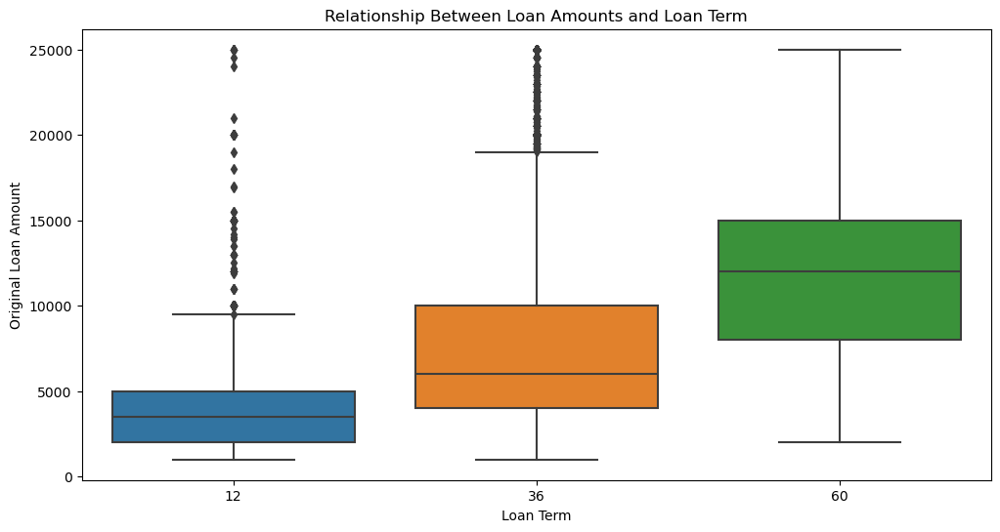

In [67]:
fig = plt.figure(figsize=(12,6))
sns.boxplot(y='LoanOriginalAmount', x='Term',
            data=df_loan)
plt.title('Relationship Between Loan Amounts and Loan Term')
plt.ylabel('Original Loan Amount')
plt.xlabel('Loan Term')
plt.show()

In [68]:
df_loan.columns

Index(['ListingNumber', 'ProsperRating (Alpha)', 'ProsperScore',
       'ListingCategory (numeric)', 'Occupation', 'EmploymentStatus',
       'CurrentCreditLines', 'OpenRevolvingAccounts', 'DebtToIncomeRatio',
       'IncomeVerifiable', 'LoanOriginalAmount', 'LoanStatus',
       'TotalInquiries', 'TotalTrades', 'CreditScoreRangeLower',
       'CreditScoreRangeUpper', 'BorrowerState', 'LoanOriginationDate',
       'LoanCurrentDaysDelinquent', 'IncomeRange', 'MonthlyLoanPayment',
       'BorrowerAPR', 'BorrowerRate', 'StatedMonthlyIncome', 'Term',
       'ClosedDate', 'ListingCategory (label)', 'Status', 'OriginationYear',
       'OriginationMonth'],
      dtype='object')

# __Multivarient Analysis__

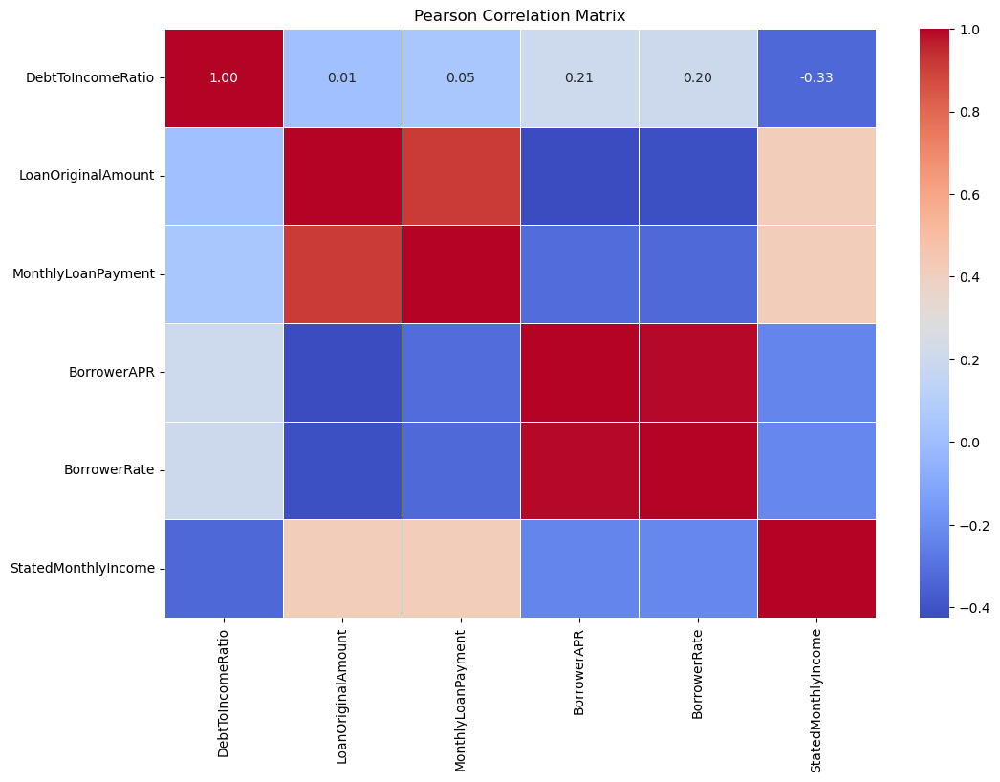

In [69]:
numerical_features = [ 'DebtToIncomeRatio', 
    'LoanOriginalAmount', 
    'MonthlyLoanPayment', 
    'BorrowerAPR', 
    'BorrowerRate', 
    'StatedMonthlyIncome']

# Calculating correlation coefficients using Pearson method
pearson_correlation = df_loan[numerical_features].corr(method='pearson')



# Printing correlation matrices
plt.figure(figsize=(12, 8))
sns.heatmap(pearson_correlation, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Pearson Correlation Matrix')
plt.show()



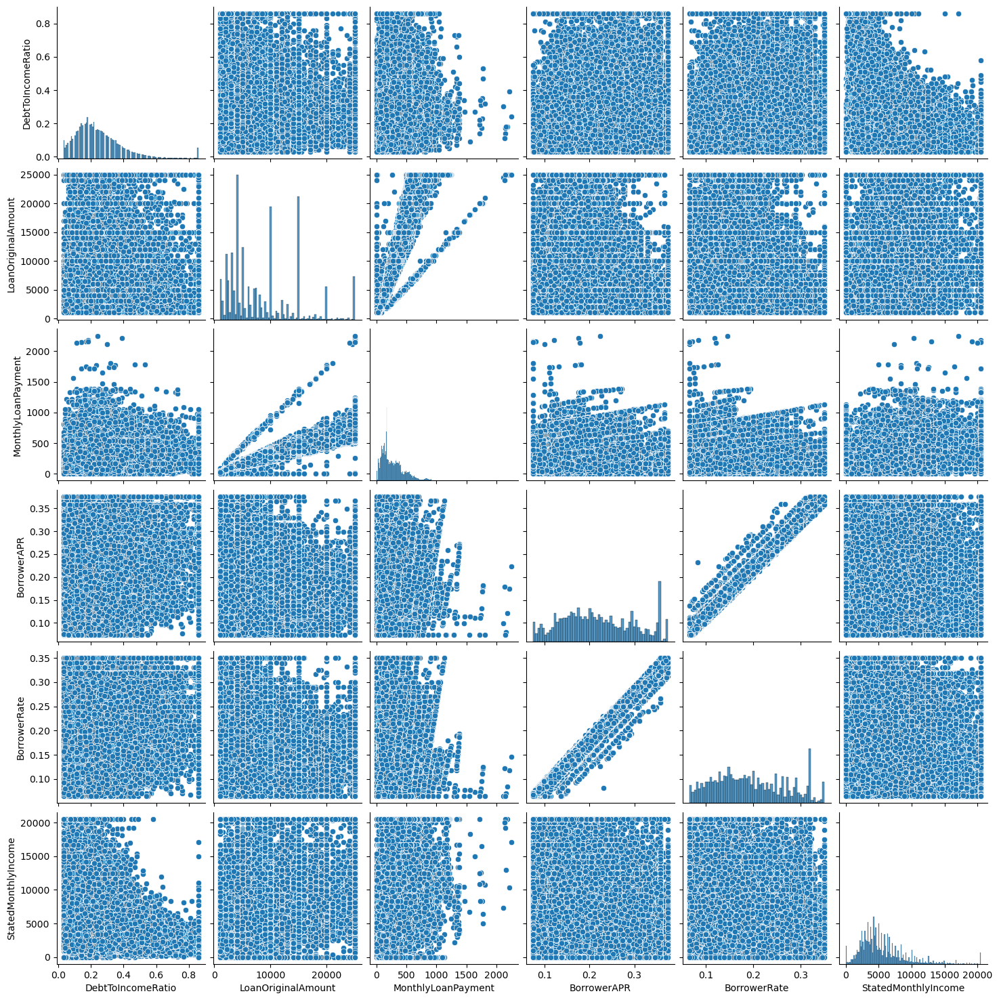

In [70]:
sns.pairplot(df[numerical_features])
plt.show()

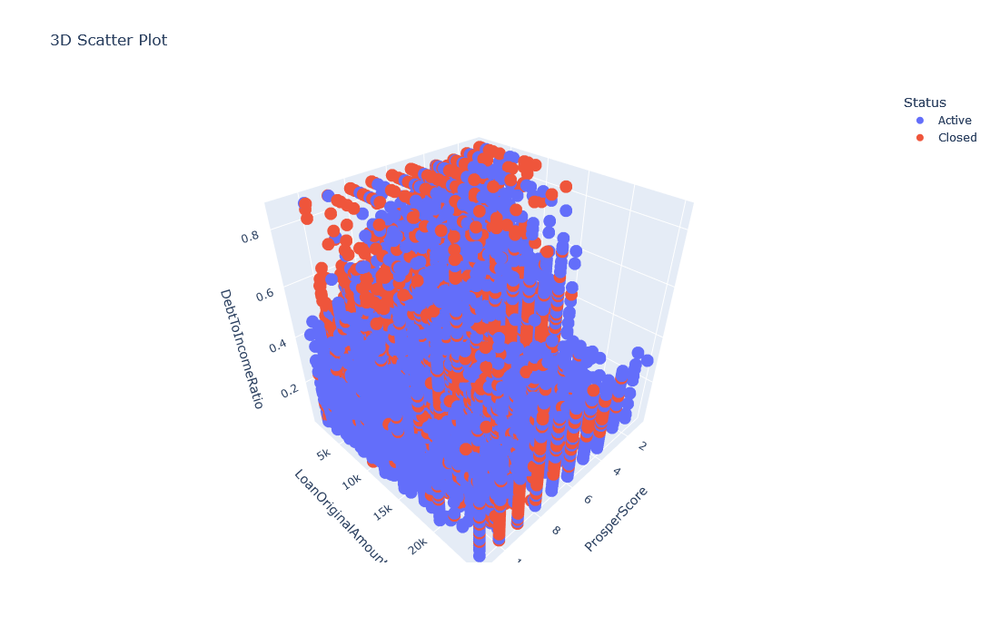

In [71]:
import plotly.express as px

# Create the 3D scatter plot
fig = px.scatter_3d(df_loan, x='ProsperScore', y='LoanOriginalAmount', z='DebtToIncomeRatio',
                    color='Status', title='3D Scatter Plot', width=1000, height=700)

# Show the plot
fig.show()

# **Data Labelling**

In [72]:
employment_mapping = {
    'Self-employed': 'Employed',
    'Employed': 'Employed',
    'Not available': 'Not Employed',
    'Full-time': 'Employed',
    'Other': 'Other',
    'Not employed': 'Not Employed',
    'Part-time': 'Employed',
    'Retired': 'Not Employed'
}

# Apply mapping to the 'EmploymentStatus' column
df['EmploymentStatus'] = df['EmploymentStatus'].map(employment_mapping)

# Display the unique values after mapping
print(df['EmploymentStatus'].unique())

['Employed' 'Not Employed' 'Other' nan]


In [73]:
income_mapping = {
    '$0': 'No Income',
    'Not employed': 'No Income',
    'Not displayed': 'No Income',
    '$1-24,999': 'Low Income',
    '$25,000-49,999': 'Medium Income',
    '$50,000-74,999': 'Medium Income',
    '$75,000-99,999': 'High Income',
    '$100,000+': 'High Income'
}
# Apply the mapping
df['IncomeRange'] = df['IncomeRange'].map(income_mapping)
income_order = ['No Income', 'Low Income', 'Medium Income', 'High Income']


In [74]:
regions = {
    'West': ['CA', 'WA', 'OR', 'NV', 'AZ', 'NM', 'CO', 'UT', 'WY', 'ID', 'MT', 'AK', 'HI'],
    'Midwest': ['IL', 'IN', 'MI', 'OH', 'WI', 'IA', 'KS', 'MN', 'MO', 'NE', 'ND', 'SD'],
    'Northeast': ['NY', 'NJ', 'PA', 'MA', 'CT', 'RI', 'VT', 'NH', 'ME'],
    'South': ['TX', 'FL', 'NC', 'GA', 'VA', 'MD', 'SC', 'TN', 'AL', 'KY', 'LA', 'OK', 'MS', 'AR', 'WV', 'DE', 'DC']
}

df_loan['Region'] = df_loan['BorrowerState'].map({state: region for region, states in regions.items() for state in states})

In [75]:
occupation_mapping = {
    'Healthcare': ['Nurse (RN)', 'Nurse (LPN)', "Nurse's Aide", 'Medical Technician', 'Dentist', 'Doctor', 'Pharmacist', 'Psychologist'],
    'Education': ['Teacher', 'Professor', 'Principal', "Teacher's Aide", 'Student - College Senior', 'Student - College Graduate Student', 'Student - Technical School', 'Student - College Sophomore', 'Student - College Junior', 'Student - Community College', 'Student - College Freshman'],
    'Service': ['Waiter/Waitress', 'Food Service', 'Food Service Management', 'Bus Driver', 'Flight Attendant', 'Postal Service', 'Clergy', 'Religious', 'Homemaker'],
    'Trades': ['Skilled Labor', 'Laborer', 'Construction', 'Tradesman - Mechanic', 'Tradesman - Electrician', 'Tradesman - Carpenter', 'Tradesman - Plumber', 'Truck Driver', 'Landscaping'],
    'Professional Services': ['Accountant/CPA', 'Attorney', 'Analyst', 'Computer Programmer', 'Engineer - Mechanical', 'Engineer - Electrical', 'Engineer - Chemical', 'Architect', 'Scientist', 'Chemist', 'Biologist', 'Civil Service', 'Social Worker', 'Police Officer/Correction Officer', 'Fireman', 'Judge'],
    'Sales and Retail': ['Sales - Retail', 'Sales - Commission', 'Retail Management', 'Car Dealer', 'Realtor'],
    'Management and Administration': ['Administrative Assistant', 'Clerical', 'Executive', 'Food Service Management', 'Professional', 'Principal'],
    'Military and Security': ['Military Enlisted', 'Military Officer', 'Police Officer/Correction Officer', 'Fireman'],
    'Other': ['Other', 'Investor', 'Pilot - Private/Commercial']
}

def map_occupation(occupation):
    for category, occupations in occupation_mapping.items():
        if occupation in occupations:
            return category
    return 'Other'

df_loan['Occupation Category'] = df_loan['Occupation'].apply(map_occupation)

In [76]:
df_loan.head()

,ListingNumber,ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),Occupation,EmploymentStatus,CurrentCreditLines,OpenRevolvingAccounts,DebtToIncomeRatio,IncomeVerifiable,...,BorrowerRate,StatedMonthlyIncome,Term,ClosedDate,ListingCategory (label),Status,OriginationYear,OriginationMonth,Region,Occupation Category
1,1209647,A,7.0,2,Professional,Employed,14.0,13,0.18,True,...,0.0920,6125.000000,36,NaN,Home Improvement,Active,2014,3,West,Management and Administration
3,658116,A,9.0,16,Skilled Labor,Employed,5.0,7,0.15,True,...,0.0974,2875.000000,36,NaN,Motorcycle,Active,2012,11,South,Trades
4,909464,D,4.0,2,Executive,Employed,19.0,6,0.26,True,...,0.2085,9583.333333,36,NaN,Home Improvement,Active,2013,9,Midwest,Management and Administration
5,1074836,B,10.0,1,Professional,Employed,21.0,13,0.36,True,...,0.1314,8333.333333,60,NaN,Debt Consolidation,Active,2013,12,West,Management and Administration
6,750899,E,2.0,1,Sales - Retail,Employed,10.0,6,0.27,True,...,0.2712,2083.333333,36,NaN,Debt Consolidation,Active,2013,4,Midwest,Sales and Retail


In [77]:
df_loan['LoanCurrentDaysDelinquent'].unique()

array([   0,    3,  140, ..., 1545,  494, 1355], dtype=int64)

In [78]:
pd.set_option('display.max_columns', None)
df_loan.head()

,ListingNumber,ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),Occupation,EmploymentStatus,CurrentCreditLines,OpenRevolvingAccounts,DebtToIncomeRatio,IncomeVerifiable,LoanOriginalAmount,LoanStatus,TotalInquiries,TotalTrades,CreditScoreRangeLower,CreditScoreRangeUpper,BorrowerState,LoanOriginationDate,LoanCurrentDaysDelinquent,IncomeRange,MonthlyLoanPayment,BorrowerAPR,BorrowerRate,StatedMonthlyIncome,Term,ClosedDate,ListingCategory (label),Status,OriginationYear,OriginationMonth,Region,Occupation Category
1,1209647,A,7.0,2,Professional,Employed,14.0,13,0.18,True,10000,Current,5.0,29.0,680.0,699.0,CO,2014-03-03,0,"$50,000-74,999",318.93,0.12016,0.0920,6125.000000,36,NaN,Home Improvement,Active,2014,3,West,Management and Administration
3,658116,A,9.0,16,Skilled Labor,Employed,5.0,7,0.15,True,10000,Current,1.0,26.0,800.0,819.0,GA,2012-11-01,0,"$25,000-49,999",321.45,0.12528,0.0974,2875.000000,36,NaN,Motorcycle,Active,2012,11,South,Trades
4,909464,D,4.0,2,Executive,Employed,19.0,6,0.26,True,15000,Current,9.0,39.0,680.0,699.0,MN,2013-09-20,0,"$100,000+",563.97,0.24614,0.2085,9583.333333,36,NaN,Home Improvement,Active,2013,9,Midwest,Management and Administration
5,1074836,B,10.0,1,Professional,Employed,21.0,13,0.36,True,15000,Current,2.0,47.0,740.0,759.0,NM,2013-12-24,0,"$100,000+",342.37,0.15425,0.1314,8333.333333,60,NaN,Debt Consolidation,Active,2013,12,West,Management and Administration
6,750899,E,2.0,1,Sales - Retail,Employed,10.0,6,0.27,True,3000,Current,0.0,16.0,680.0,699.0,KS,2013-04-18,0,"$25,000-49,999",122.67,0.31032,0.2712,2083.333333,36,NaN,Debt Consolidation,Active,2013,4,Midwest,Sales and Retail


In [79]:
df_loan.drop(['ListingNumber','Occupation','LoanStatus','ClosedDate','BorrowerState','LoanOriginationDate'],axis=1,inplace=True)

In [80]:
df_loan.info()

<class 'pandas.core.frame.DataFrame'>
Index: 77557 entries, 1 to 113936
Data columns (total 26 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   ProsperRating (Alpha)      77557 non-null  object 
 1   ProsperScore               77557 non-null  float64
 2   ListingCategory (numeric)  77557 non-null  int64  
 3   EmploymentStatus           77557 non-null  object 
 4   CurrentCreditLines         77557 non-null  float64
 5   OpenRevolvingAccounts      77557 non-null  int64  
 6   DebtToIncomeRatio          77557 non-null  float64
 7   IncomeVerifiable           77557 non-null  bool   
 8   LoanOriginalAmount         77557 non-null  int64  
 9   TotalInquiries             77557 non-null  float64
 10  TotalTrades                77557 non-null  float64
 11  CreditScoreRangeLower      77557 non-null  float64
 12  CreditScoreRangeUpper      77557 non-null  float64
 13  LoanCurrentDaysDelinquent  77557 non-null  int64  

In [81]:
pd.set_option('display.max_columns', None)
df_loan.head()

,ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),EmploymentStatus,CurrentCreditLines,OpenRevolvingAccounts,DebtToIncomeRatio,IncomeVerifiable,LoanOriginalAmount,TotalInquiries,TotalTrades,CreditScoreRangeLower,CreditScoreRangeUpper,LoanCurrentDaysDelinquent,IncomeRange,MonthlyLoanPayment,BorrowerAPR,BorrowerRate,StatedMonthlyIncome,Term,ListingCategory (label),Status,OriginationYear,OriginationMonth,Region,Occupation Category
1,A,7.0,2,Employed,14.0,13,0.18,True,10000,5.0,29.0,680.0,699.0,0,"$50,000-74,999",318.93,0.12016,0.0920,6125.000000,36,Home Improvement,Active,2014,3,West,Management and Administration
3,A,9.0,16,Employed,5.0,7,0.15,True,10000,1.0,26.0,800.0,819.0,0,"$25,000-49,999",321.45,0.12528,0.0974,2875.000000,36,Motorcycle,Active,2012,11,South,Trades
4,D,4.0,2,Employed,19.0,6,0.26,True,15000,9.0,39.0,680.0,699.0,0,"$100,000+",563.97,0.24614,0.2085,9583.333333,36,Home Improvement,Active,2013,9,Midwest,Management and Administration
5,B,10.0,1,Employed,21.0,13,0.36,True,15000,2.0,47.0,740.0,759.0,0,"$100,000+",342.37,0.15425,0.1314,8333.333333,60,Debt Consolidation,Active,2013,12,West,Management and Administration
6,E,2.0,1,Employed,10.0,6,0.27,True,3000,0.0,16.0,680.0,699.0,0,"$25,000-49,999",122.67,0.31032,0.2712,2083.333333,36,Debt Consolidation,Active,2013,4,Midwest,Sales and Retail


In [82]:
df_loan.columns

Index(['ProsperRating (Alpha)', 'ProsperScore', 'ListingCategory (numeric)',
       'EmploymentStatus', 'CurrentCreditLines', 'OpenRevolvingAccounts',
       'DebtToIncomeRatio', 'IncomeVerifiable', 'LoanOriginalAmount',
       'TotalInquiries', 'TotalTrades', 'CreditScoreRangeLower',
       'CreditScoreRangeUpper', 'LoanCurrentDaysDelinquent', 'IncomeRange',
       'MonthlyLoanPayment', 'BorrowerAPR', 'BorrowerRate',
       'StatedMonthlyIncome', 'Term', 'ListingCategory (label)', 'Status',
       'OriginationYear', 'OriginationMonth', 'Region', 'Occupation Category'],
      dtype='object')

In [83]:
df_loan['ProsperRating (Alpha)'].value_counts()

ProsperRating (Alpha)
C     16890
B     14631
A     13705
D     12824
E      8617
HR     5739
AA     5151
Name: count, dtype: int64

In [84]:
df_loan['ProsperRating (Alpha)'].unique()

array(['A', 'D', 'B', 'E', 'C', 'AA', 'HR'], dtype=object)

In [85]:
df_loan['ProsperRating (Alpha)'].dtypes

dtype('O')

In [86]:
df_loan.info()

<class 'pandas.core.frame.DataFrame'>
Index: 77557 entries, 1 to 113936
Data columns (total 26 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   ProsperRating (Alpha)      77557 non-null  object 
 1   ProsperScore               77557 non-null  float64
 2   ListingCategory (numeric)  77557 non-null  int64  
 3   EmploymentStatus           77557 non-null  object 
 4   CurrentCreditLines         77557 non-null  float64
 5   OpenRevolvingAccounts      77557 non-null  int64  
 6   DebtToIncomeRatio          77557 non-null  float64
 7   IncomeVerifiable           77557 non-null  bool   
 8   LoanOriginalAmount         77557 non-null  int64  
 9   TotalInquiries             77557 non-null  float64
 10  TotalTrades                77557 non-null  float64
 11  CreditScoreRangeLower      77557 non-null  float64
 12  CreditScoreRangeUpper      77557 non-null  float64
 13  LoanCurrentDaysDelinquent  77557 non-null  int64  

# **Data Encoding**

In [87]:
from sklearn.preprocessing import LabelEncoder
LabelEncoder=LabelEncoder()


df_loan['ProsperRating (Alpha)'] = LabelEncoder.fit_transform(df_loan['ProsperRating (Alpha)'])
df_loan.head()

,ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),EmploymentStatus,CurrentCreditLines,OpenRevolvingAccounts,DebtToIncomeRatio,IncomeVerifiable,LoanOriginalAmount,TotalInquiries,TotalTrades,CreditScoreRangeLower,CreditScoreRangeUpper,LoanCurrentDaysDelinquent,IncomeRange,MonthlyLoanPayment,BorrowerAPR,BorrowerRate,StatedMonthlyIncome,Term,ListingCategory (label),Status,OriginationYear,OriginationMonth,Region,Occupation Category
1,0,7.0,2,Employed,14.0,13,0.18,True,10000,5.0,29.0,680.0,699.0,0,"$50,000-74,999",318.93,0.12016,0.0920,6125.000000,36,Home Improvement,Active,2014,3,West,Management and Administration
3,0,9.0,16,Employed,5.0,7,0.15,True,10000,1.0,26.0,800.0,819.0,0,"$25,000-49,999",321.45,0.12528,0.0974,2875.000000,36,Motorcycle,Active,2012,11,South,Trades
4,4,4.0,2,Employed,19.0,6,0.26,True,15000,9.0,39.0,680.0,699.0,0,"$100,000+",563.97,0.24614,0.2085,9583.333333,36,Home Improvement,Active,2013,9,Midwest,Management and Administration
5,2,10.0,1,Employed,21.0,13,0.36,True,15000,2.0,47.0,740.0,759.0,0,"$100,000+",342.37,0.15425,0.1314,8333.333333,60,Debt Consolidation,Active,2013,12,West,Management and Administration
6,5,2.0,1,Employed,10.0,6,0.27,True,3000,0.0,16.0,680.0,699.0,0,"$25,000-49,999",122.67,0.31032,0.2712,2083.333333,36,Debt Consolidation,Active,2013,4,Midwest,Sales and Retail


In [88]:
df_loan.columns

Index(['ProsperRating (Alpha)', 'ProsperScore', 'ListingCategory (numeric)',
       'EmploymentStatus', 'CurrentCreditLines', 'OpenRevolvingAccounts',
       'DebtToIncomeRatio', 'IncomeVerifiable', 'LoanOriginalAmount',
       'TotalInquiries', 'TotalTrades', 'CreditScoreRangeLower',
       'CreditScoreRangeUpper', 'LoanCurrentDaysDelinquent', 'IncomeRange',
       'MonthlyLoanPayment', 'BorrowerAPR', 'BorrowerRate',
       'StatedMonthlyIncome', 'Term', 'ListingCategory (label)', 'Status',
       'OriginationYear', 'OriginationMonth', 'Region', 'Occupation Category'],
      dtype='object')

In [89]:
from sklearn.preprocessing import LabelEncoder
# List of categorical columns
categorical_columns = ['ProsperRating (Alpha)', 'EmploymentStatus', 'IncomeVerifiable', 
                       'IncomeRange', 'ListingCategory (label)', 'Region', 
                       'Occupation Category', 'Status']

# Initialize the label encoder
label_encoders = {}
for column in categorical_columns:
    label_encoders[column] = LabelEncoder()
    df_loan[column] = label_encoders[column].fit_transform(df_loan[column])

In [90]:
df_loan.info()

<class 'pandas.core.frame.DataFrame'>
Index: 77557 entries, 1 to 113936
Data columns (total 26 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   ProsperRating (Alpha)      77557 non-null  int64  
 1   ProsperScore               77557 non-null  float64
 2   ListingCategory (numeric)  77557 non-null  int64  
 3   EmploymentStatus           77557 non-null  int32  
 4   CurrentCreditLines         77557 non-null  float64
 5   OpenRevolvingAccounts      77557 non-null  int64  
 6   DebtToIncomeRatio          77557 non-null  float64
 7   IncomeVerifiable           77557 non-null  int64  
 8   LoanOriginalAmount         77557 non-null  int64  
 9   TotalInquiries             77557 non-null  float64
 10  TotalTrades                77557 non-null  float64
 11  CreditScoreRangeLower      77557 non-null  float64
 12  CreditScoreRangeUpper      77557 non-null  float64
 13  LoanCurrentDaysDelinquent  77557 non-null  int64  

In [91]:
df_loan.head()

,ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),EmploymentStatus,CurrentCreditLines,OpenRevolvingAccounts,DebtToIncomeRatio,IncomeVerifiable,LoanOriginalAmount,TotalInquiries,TotalTrades,CreditScoreRangeLower,CreditScoreRangeUpper,LoanCurrentDaysDelinquent,IncomeRange,MonthlyLoanPayment,BorrowerAPR,BorrowerRate,StatedMonthlyIncome,Term,ListingCategory (label),Status,OriginationYear,OriginationMonth,Region,Occupation Category
1,0,7.0,2,0,14.0,13,0.18,1,10000,5.0,29.0,680.0,699.0,0,3,318.93,0.12016,0.0920,6125.000000,36,8,0,2014,3,3,2
3,0,9.0,16,0,5.0,7,0.15,1,10000,1.0,26.0,800.0,819.0,0,2,321.45,0.12528,0.0974,2875.000000,36,12,0,2012,11,2,8
4,4,4.0,2,0,19.0,6,0.26,1,15000,9.0,39.0,680.0,699.0,0,1,563.97,0.24614,0.2085,9583.333333,36,8,0,2013,9,0,2
5,2,10.0,1,0,21.0,13,0.36,1,15000,2.0,47.0,740.0,759.0,0,1,342.37,0.15425,0.1314,8333.333333,60,5,0,2013,12,3,2
6,5,2.0,1,0,10.0,6,0.27,1,3000,0.0,16.0,680.0,699.0,0,2,122.67,0.31032,0.2712,2083.333333,36,5,0,2013,4,0,6


In [92]:
df_loan.shape

(77557, 26)

In [93]:
for col in categorical_columns:
    unique_values = sorted(df_loan[col].unique())
    print(f"{col}: {unique_values}")

ProsperRating (Alpha): [0, 1, 2, 3, 4, 5, 6]
EmploymentStatus: [0, 1, 2, 3, 4, 5, 6]
IncomeVerifiable: [0, 1]
IncomeRange: [0, 1, 2, 3, 4, 5]
ListingCategory (label): [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
Region: [0, 1, 2, 3]
Occupation Category: [0, 1, 2, 3, 4, 5, 6, 7, 8]
Status: [0, 1]


In [94]:
df_loan.values

array([[ 0.,  7.,  2., ...,  3.,  3.,  2.],
       [ 0.,  9., 16., ..., 11.,  2.,  8.],
       [ 4.,  4.,  2., ...,  9.,  0.,  2.],
       ...,
       [ 4.,  3.,  1., ..., 12.,  2.,  4.],
       [ 3.,  5.,  2., ..., 11.,  2.,  7.],
       [ 0.,  7.,  1., ...,  1.,  1.,  0.]])

In [95]:
df_loan.columns

Index(['ProsperRating (Alpha)', 'ProsperScore', 'ListingCategory (numeric)',
       'EmploymentStatus', 'CurrentCreditLines', 'OpenRevolvingAccounts',
       'DebtToIncomeRatio', 'IncomeVerifiable', 'LoanOriginalAmount',
       'TotalInquiries', 'TotalTrades', 'CreditScoreRangeLower',
       'CreditScoreRangeUpper', 'LoanCurrentDaysDelinquent', 'IncomeRange',
       'MonthlyLoanPayment', 'BorrowerAPR', 'BorrowerRate',
       'StatedMonthlyIncome', 'Term', 'ListingCategory (label)', 'Status',
       'OriginationYear', 'OriginationMonth', 'Region', 'Occupation Category'],
      dtype='object')

# **Principal Component Analysis**

In [96]:
X=df_loan.drop('Status',axis=1)
y = df_loan['Status']

In [97]:
from sklearn.preprocessing import StandardScaler

scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)
X_scaled

array([[-1.52705282,  0.3970779 , -0.29296959, ..., -1.00338751,
         1.29203299, -0.9311046 ],
       [-1.52705282,  1.24369639,  2.89948545, ...,  1.16752049,
         0.36002965,  1.90969816],
       [ 0.68771563, -0.87284983, -0.29296959, ...,  0.62479349,
        -1.50397701, -0.9311046 ],
       ...,
       [ 0.68771563, -1.29615907, -0.5210021 , ...,  1.43888399,
         0.36002965,  0.01582965],
       [ 0.13402352, -0.44954059, -0.29296959, ...,  1.16752049,
         0.36002965,  1.43623104],
       [-1.52705282,  0.3970779 , -0.5210021 , ..., -1.54611451,
        -0.57197368, -1.87803886]])

In [98]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X_scaled,y,test_size=0.2,random_state=30)

In [99]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.decomposition import PCA

In [100]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Step 2: Apply PCA
pca = PCA(n_components=0.95)  # Retain components that explain 95% of the variance
X_pca = pca.fit_transform(X_scaled)

# Step 3: Create a DataFrame with the principal components
pca_columns = [f'PC{i}' for i in range(1, pca.n_components_ + 1)]  # Create column names for PCs
df_pca = pd.DataFrame(data=X_pca, columns=pca_columns)

In [101]:
df_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17
0,2.131770,0.622551,-0.054300,-0.703902,-0.636867,-2.069144,0.966704,-1.098108,-0.054562,-0.397568,1.019796,-0.654172,-0.429225,0.382428,0.461406,-0.390886,-0.375626
1,2.684091,-3.304636,2.105393,-1.061287,-1.228111,0.951076,-0.805689,0.708984,0.707168,0.095276,-1.612014,-1.535300,0.193472,0.442146,0.210811,-0.451165,0.335935
2,0.070670,2.507521,-0.074178,-1.305147,1.005839,0.682120,0.418709,0.657071,-1.313522,-0.047929,-0.401729,0.645317,1.278896,-0.676134,0.980748,-0.232796,0.542840
3,3.124743,2.198642,1.181760,0.409858,0.423071,0.607108,-0.086751,0.280272,-0.343514,-1.685341,-0.443168,0.072763,-2.046592,0.998840,0.059451,-0.018006,0.679585
4,-2.716679,0.025139,-0.816695,1.229940,-1.512897,0.017446,-0.384856,-0.019214,-0.810617,0.781450,-0.771151,0.671618,1.268209,0.598120,-0.516177,-0.535805,-0.366223


In [102]:

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

# Train the Logistic Regression model
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

# Make predictions
y_pred = logreg.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy with 15 principal components: {accuracy}")

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Accuracy with 15 principal components: 0.8583032490974729

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.94      0.91     11741
           1       0.76      0.61      0.68      3771

    accuracy                           0.86     15512
   macro avg       0.82      0.77      0.79     15512
weighted avg       0.85      0.86      0.85     15512


Confusion Matrix:
[[11017   724]
 [ 1474  2297]]


In [103]:
explained_variance = pca.explained_variance_ratio_
print("Explained Variance Ratio of each principal component:")
print(explained_variance)
print("\nCumulative Explained Variance Ratio:")
print(explained_variance.cumsum())

Explained Variance Ratio of each principal component:
[0.20717806 0.11682158 0.07671165 0.06575328 0.05768712 0.05055492
 0.04630294 0.04264444 0.04144141 0.03983378 0.03822744 0.03809152
 0.03597868 0.03126273 0.02842498 0.02178668 0.01755193]

Cumulative Explained Variance Ratio:
[0.20717806 0.32399964 0.40071128 0.46646456 0.52415169 0.57470661
 0.62100954 0.66365398 0.7050954  0.74492918 0.78315662 0.82124814
 0.85722682 0.88848955 0.91691453 0.9387012  0.95625313]


# **Summary of Findings**

# **Recommadations**

In [104]:
df.head()

,ListingNumber,ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),Occupation,EmploymentStatus,CurrentCreditLines,OpenRevolvingAccounts,DebtToIncomeRatio,IncomeVerifiable,LoanOriginalAmount,LoanStatus,TotalInquiries,TotalTrades,CreditScoreRangeLower,CreditScoreRangeUpper,BorrowerState,LoanOriginationDate,LoanCurrentDaysDelinquent,IncomeRange,MonthlyLoanPayment,BorrowerAPR,BorrowerRate,StatedMonthlyIncome,Term,ClosedDate
0,193129,NaN,NaN,0,Other,Employed,5.0,1,0.17,True,9425,Completed,3.0,11.0,640.0,659.0,CO,12-09-2007 00:00,0,Medium Income,330.43,0.16516,0.1580,3083.333333,36,14-08-2009 00:00
1,1209647,A,7.0,2,Professional,Employed,14.0,13,0.18,True,10000,Current,5.0,29.0,680.0,699.0,CO,03-03-2014 00:00,0,Medium Income,318.93,0.12016,0.0920,6125.000000,36,NaN
2,81716,NaN,NaN,0,Other,Not Employed,NaN,0,0.06,True,3001,Completed,1.0,NaN,500.0,519.0,GA,17-01-2007 00:00,0,No Income,123.32,0.28269,0.2750,2083.333333,36,17-12-2009 00:00
3,658116,A,9.0,16,Skilled Labor,Employed,5.0,7,0.15,True,10000,Current,1.0,26.0,800.0,819.0,GA,01-11-2012 00:00,0,Medium Income,321.45,0.12528,0.0974,2875.000000,36,NaN
4,909464,D,4.0,2,Executive,Employed,19.0,6,0.26,True,15000,Current,9.0,39.0,680.0,699.0,MN,20-09-2013 00:00,0,High Income,563.97,0.24614,0.2085,9583.333333,36,NaN


In [105]:
df.isna().sum()

ListingNumber                    0
ProsperRating (Alpha)        29084
ProsperScore                 29084
ListingCategory (numeric)        0
Occupation                    3588
EmploymentStatus              2255
CurrentCreditLines            7604
OpenRevolvingAccounts            0
DebtToIncomeRatio             8554
IncomeVerifiable                 0
LoanOriginalAmount               0
LoanStatus                       0
TotalInquiries                1159
TotalTrades                   7544
CreditScoreRangeLower          591
CreditScoreRangeUpper          591
BorrowerState                 5515
LoanOriginationDate              0
LoanCurrentDaysDelinquent        0
IncomeRange                      0
MonthlyLoanPayment               0
BorrowerAPR                     25
BorrowerRate                     0
StatedMonthlyIncome              0
Term                             0
ClosedDate                   58848
dtype: int64

In [106]:
df['LoanCurrentDaysDelinquent'].unique()

array([   0,    3,  140, ...,  916, 2349, 1081], dtype=int64)

<Axes: >

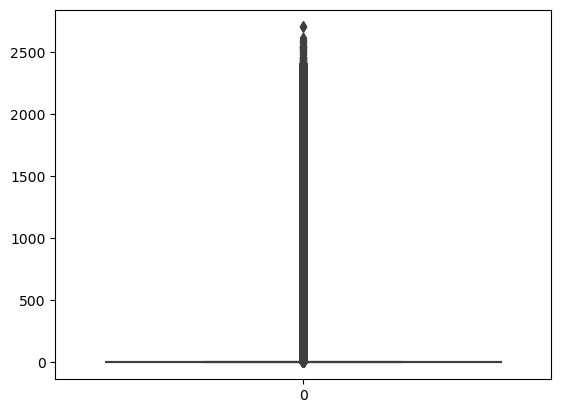

In [107]:
sns.boxplot(df['LoanCurrentDaysDelinquent'])